# Load scenario results & create corresponding plots

## Preamble

Import packages & functions.

In [ ]:
import pandas as pd
import numpy as np
import os
import pickle 

from _13_GWPstar_functions import *
from _21_plot_scenarios import *

Load `.pkl` files that were generated with `_20_run_scenarios.py`.

In [2]:
with open('pickled_scenario_results/scenario_results_bck.pkl', 'rb') as f:
    all_scenario_results_bck = pd.Series(pickle.load(f))
with open('pickled_scenario_results/scenario_names_bck.pkl', 'rb') as f:
    all_scenario_names_bck = pd.Series(pickle.load(f))
    
with open('pickled_scenario_results/scenario_results.pkl', 'rb') as f:
    all_scenario_results = pd.Series(pickle.load(f))
with open('pickled_scenario_results/scenario_names.pkl', 'rb') as f:
    all_scenario_names = pd.Series(pickle.load(f))

Prepare variables used in visualisation.

In [3]:
LU_red = '#be1908'
LU_orange = '#f46e32'
LU_turqoise = '#34a3a9'
LU_light_blue = '#5cb1eb'
LU_violet = '#b02079'
LU_green = '#2c712d'
LU_blue = '#001158'

# the original figures use Helvetica, but other fonts also work
plt.rcParams.update({
    'font.size': 11, 
    'axes.labelsize': 11,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 8,
    'text.usetex': True, # requires LaTeX installation; some figures will have visual errors without
    'font.family': 'Helvetica',
})
plt.rcParams['text.latex.preamble'] = r'''
\usepackage{siunitx}
\sisetup{detect-all}
\usepackage{helvet}
\usepackage{sansmath}
\sansmath
'''

subplot_fontweight = 'normal' # 'bold'
subplot_fontsize = 11
annotation_fontsize = 8
plot_width = 7.2 # inches

folder_figures = 'figures/'
folder_csvs = 'figures_data/'

if not os.path.isdir(folder_figures): os.makedirs(folder_figures)
if not os.path.isdir(folder_csvs): os.makedirs(folder_csvs)

linestyles = ['--','-.','-']
colours = [LU_turqoise, LU_orange, LU_red, LU_light_blue, LU_green, LU_violet]
colours_ac_fleet = [LU_turqoise, LU_orange, LU_red, LU_red, LU_light_blue, LU_light_blue]
alpha = 1

## Process data

Prepare variables used in scenario interpretation.

In [4]:
flight_start_year = 2024
flight_end_year = 2070

years_graph = list(range(flight_start_year,flight_end_year + 1)) # the range shown along the y-axis for most plots
year_of_interest = 2070 # the year in which emission targets are evaluated (always compared to 2050)
years = years_graph # the years sometimes used for additional calculation, must encompass years_graph

Define the ICOA/IATA target and calculate corresponding RF & temperature change.

In [5]:
max_line = []
for year in years:
    corisa_baseline = 127.5e9 # running the model results in 150 Mton CO2 in 2019; new CORSIA baseline is 85% of 2019 (note: EASA cites 147 Mtons in 2019).
    if year <= 2035: max_line.append(corisa_baseline) 
    elif year <= 2050: max_line.append(corisa_baseline*(2050-year)/(2050-2035))
    else: max_line.append(0.0)

# calculate using LWE        
max_RF_input = np.zeros([len(years),19])
max_RF_input[:,0] = years
max_RF_input[:,12] = max_line
max_RF_input = pd.DataFrame(max_RF_input)
RF, RF_low, RF_high = emissions_to_LWE(max_RF_input, years[0], years[-1])
RF_CO2_target = RF.iloc[:,0] # variable showing RF for each year when using emissions limit

# calculate using GWP*
params = ModelParameters(flight_start_year, flight_end_year)
max_GWPstar = TemperatureGWPStar(parameters=params)
contrails_erf = nox_short_term_o3_increase_erf = nox_long_term_o3_decrease_erf = nox_ch4_decrease_erf = nox_stratospheric_water_vapor_decrease_erf = soot_erf = h2o_erf = sulfur_erf = co2_erf = total_erf = ch4_erf = h2_erf = pd.Series([0]*len(years), index=years)
co2_emissions = pd.Series(max_line, index=years) * 1e-9 # convert from kg to Mton
max_GWPstar_results = max_GWPstar.compute(
        contrails_gwpstar_variation_duration,
        contrails_gwpstar_s_coefficient,
        nox_short_term_o3_increase_gwpstar_variation_duration,
        nox_short_term_o3_increase_gwpstar_s_coefficient,
        nox_long_term_o3_decrease_gwpstar_variation_duration,
        nox_long_term_o3_decrease_gwpstar_s_coefficient,
        nox_ch4_decrease_gwpstar_variation_duration,
        nox_ch4_decrease_gwpstar_s_coefficient,
        nox_stratospheric_water_vapor_decrease_gwpstar_variation_duration,
        nox_stratospheric_water_vapor_decrease_gwpstar_s_coefficient,
        soot_gwpstar_variation_duration,
        soot_gwpstar_s_coefficient,
        h2o_gwpstar_variation_duration,
        h2o_gwpstar_s_coefficient,
        sulfur_gwpstar_variation_duration,
        sulfur_gwpstar_s_coefficient,
        contrails_erf,
        nox_short_term_o3_increase_erf,
        nox_long_term_o3_decrease_erf,
        nox_ch4_decrease_erf,
        nox_stratospheric_water_vapor_decrease_erf,
        soot_erf,
        h2o_erf,
        sulfur_erf,
        co2_erf,
        total_erf,
        co2_emissions,
        tcre_coefficient,
        ch4_gwpstar_variation_duration,
        ch4_gwpstar_s_coefficient,
        ch4_erf,
        h2_gwpstar_variation_duration,
        h2_gwpstar_s_coefficient,
        h2_erf,
    )
dT_CO2_target = max_GWPstar.df_climate['temperature_increase_from_aviation'].drop(flight_start_year-1)

Define illustrative scenarios.

In [6]:
# variables for all main text scenarios
universal           = {'background scenario': '1.7C',
                       'H2 source': 'grid',
                       'operational improvements': False,
                       }

# variables for main text scenarios
high_growth_base    = {'demand change': 'high growth', 
                       'aircraft technology': 'high', 
                       'H2 aircraft technology': 'high',
                       'name base': 'breakthrough AC technology \n with high growth',
                       'colour': LU_turqoise,
                       }
low_growth_base     = {'demand change': 'low growth', 
                       'aircraft technology': 'mid', 
                       'H2 aircraft technology': 'mid',
                       'name base': 'optimistic AC technology \n with low growth',
                       'colour': LU_orange,
                       }
degrowth_base       = {'demand change': 'degrowth', 
                       'aircraft technology': 'low', 
                       'H2 aircraft technology': 'low',
                       'name base': 'business-as-usual AC technology \n with degrowth',
                       'colour': LU_red,
                       }

noReFuelEU          = {'AAF change': 'no ReFuelEU', 
                       'AAF technology': 'low', 
                       'H2 implemented': False, 
                       'H2 aircraft technology': 'low',
                       'name AAF': 'no ReFuelEU, \n no H$_2$ AC',
                       'line style': '--',
                       }
ReFuelEU_noH2       = {'AAF change': 'ReFuelEU extended', 
                       'AAF technology': 'mid', 
                       'H2 implemented': False,
                       'H2 aircraft technology': 'low',
                       'name AAF': 'ReFuelEU extended, \n no H$_2$ AC',
                       'line style': '-.', 
                       }
ReFuelEU_yesH2      = {'AAF change': 'ReFuelEU extended', 
                       'AAF technology': 'mid', 
                       'H2 implemented': True,
                       'name AAF': 'ReFuelEU extended, \n with H$_2$ AC',
                       'line style': '-',
                       }

# create list of dictionaries housing main text scenarios
scenarios = []
for scenario_base in [high_growth_base, low_growth_base, degrowth_base]:
    for scenario_fuel in [noReFuelEU, ReFuelEU_noH2, ReFuelEU_yesH2]:
        scenario_here = {**universal, **scenario_base, **scenario_fuel}
        name_for_csv1 = scenario_here['name base'].replace('\n ','')
        name_for_csv2 = scenario_here['name AAF'].replace('\n ','').replace('$_2$','2')
        scenario_here['name for .csv'] = f"{name_for_csv1}, {name_for_csv2}"
        scenarios.append(scenario_here)

Extract results for chosen scenarios.

In [7]:
for scenario in scenarios:
    # assign dictionary values
    ac_tech     = scenario['aircraft technology']
    growth      = scenario['demand change']
    aaf_impl    = scenario['AAF change']
    h2ac_impl   = scenario['H2 implemented']
    aaf_tech    = scenario['AAF technology']
    h2ac_tech   = scenario['H2 aircraft technology']
    background  = scenario['background scenario']
    ops_imp     = scenario['operational improvements']
    hydrogen_source = scenario['H2 source']

    # retrieve results for specific scenario
    scenario_name_here = scenario_name_generator(background, hydrogen_source, growth, ac_tech, h2ac_tech, aaf_tech, ops_imp, aaf_impl, h2ac_impl)
    scenario_result_here = retrieve_scenario_results(scenario_name_here, all_scenario_names, all_scenario_results)
    
    # assign scenario results to scenario dictionary
    scenario['list of dictionaries']    = scenario_result_here[0]
    # LCIA & RF results
    scenario['LCIA DataFrame']          = scenario_result_here[1].copy()
    scenario['CO2 emissions [Mton]']    = scenario_result_here[1]['Carbon dioxide']/1e9
    scenario['CO2-eq [Mton]']           = scenario_result_here[1]['climate change']/1e9
    scenario['GWP* DF']                 = scenario_result_here[24].copy().drop(flight_start_year-1)
    scenario['dT']                      = scenario['GWP* DF']['temperature_increase_from_aviation']
    scenario['dT, CO2 only']            = scenario['GWP* DF']['temperature_increase_from_co2_from_aviation']
    scenario['dT, excl ground non-CO2'] = scenario['GWP* DF']['temperature_increase_from_aviation'] - scenario['GWP* DF']['temperature_increase_from_ch4_from_aviation'] - scenario['GWP* DF']['temperature_increase_from_h2_from_aviation']
    scenario['GWP* DF, sensitivity']    = scenario_result_here[25].copy().drop(flight_start_year-1)
    scenario['dT, sensitivity']         = scenario['GWP* DF, sensitivity']['temperature_increase_from_aviation']
    scenario['RF DF']                   = scenario_result_here[2].copy()
    scenario['RF DF, low']              = scenario_result_here[3].copy()
    scenario['RF DF, high']             = scenario_result_here[4].copy()
    scenario['RF']                      = list(scenario['RF DF'].sum(axis = 1))
    scenario['RF, CO2 only']            = list(scenario['RF DF'].iloc[:,0])
    scenario['RF DF, sensitivity']      = scenario_result_here[20].copy()
    scenario['RF DF, sensitivity, low'] = scenario_result_here[21].copy()
    scenario['RF DF, sensitivity, high'] = scenario_result_here[22].copy()
    # fuel results
    scenario['fuels']                   = scenario_result_here[8].copy()
    scenario['hydrogen fuel [EJ]']      = scenario_result_here[8]['Hydrogen fuel']/1e12
    scenario['e-fuel [EJ]']             = scenario_result_here[8]['E-fuel']/1e12
    scenario['AAF total [EJ]']          = scenario_result_here[8]['E-fuel']/1e12 + scenario_result_here[8]['Hydrogen fuel']/1e12
    scenario['fossil kerosene [EJ]']    = scenario_result_here[8]['Fossil kerosene']/1e12
    scenario['hydrogen production [EJ]'] = scenario_result_here[19].sum(axis=1)/1e12
    # fleet & RPK results
    scenario['AC fleet results']        = scenario_result_here[6].copy()
    scenario['RPK per AC']              = scenario_result_here[13].copy()

## Plot figures

Plot scenario parameters for RPK and AAF trajectories, respectively.

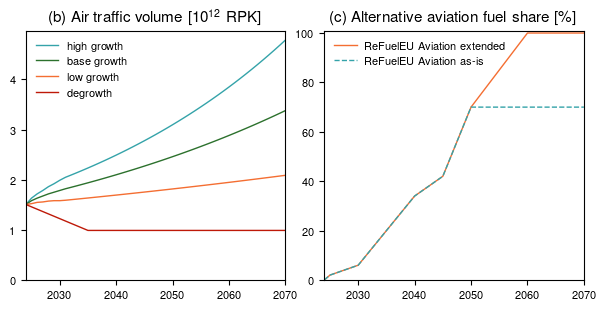

In [8]:
fig_name_rpk_aaf = 'Fig1_rpk_aaf_overview'
colours = [LU_turqoise, LU_green, LU_orange, LU_red, LU_light_blue, LU_violet]
fig, (ax_rpk, ax_aaf) = plt.subplots(1,2,gridspec_kw={'width_ratios':[1,1]},figsize = (plot_width,plot_width*0.45))

# lines for plotting RPK
fuel_scenarios = [['no ReFuelEU', False, 'low']]
ac_scenarios = [['mid',False,'high growth'],
                ['mid',False,'base growth'],
                ['mid',False,'low growth'],
                ['mid',False,'degrowth']]
background = '1.7C'
hydrogen_source = 'grid'

scenarios_rpk_per_aircraft = [[0 for i in range(len(fuel_scenarios))] for j in range(len(ac_scenarios))]
for i in range(len(ac_scenarios)):
    ac_tech = ac_scenarios[i][0]
    ops_imp = ac_scenarios[i][1]
    growth =  ac_scenarios[i][2]
    for j in range(len(fuel_scenarios)):
        aaf_impl = fuel_scenarios[j][0]
        h2ac_impl = fuel_scenarios[j][1]
        aaf_tech =  fuel_scenarios[j][2]
        h2ac_tech = 'low'
        scenario_name_here = scenario_name_generator(background, hydrogen_source, growth, ac_tech, h2ac_tech, aaf_tech, ops_imp, aaf_impl, h2ac_impl)
        scenario_result_here = retrieve_scenario_results(scenario_name_here, all_scenario_names, all_scenario_results)
        scenarios_rpk_per_aircraft[i][j] = scenario_result_here[13]
            
for i in range(len(ac_scenarios)):
    for j in range(len(fuel_scenarios)):
        ax_rpk.plot(years_graph, scenarios_rpk_per_aircraft[i][j].sum(axis=1)/1e12, color=colours[i], lw = 1, alpha = 1)

# lines for plotting AAF
aaf_timeline_as_is      = aaf_share_for_plt('ReFuelEU base', 2024, 2070)
aaf_timeline_extended   = aaf_share_for_plt('ReFuelEU extended', 2024, 2070)

ax_aaf.plot(years_graph, aaf_timeline_extended, color=colours[2], lw = 1, alpha = 1)
ax_aaf.plot(years_graph, aaf_timeline_as_is, color=colours[0], lw = 1, alpha = 1, linestyle = '--')

# formatting plots
ax_rpk.set_title('(b) Air traffic volume [$10^{12}$ RPK]', fontweight=subplot_fontweight, fontsize=subplot_fontsize)
ax_aaf.set_title('(c) Alternative aviation fuel share [\%]', fontweight=subplot_fontweight, fontsize=subplot_fontsize)

ax_rpk.set_ylim(bottom=0)  
ax_aaf.set_ylim(0,101) 
ax_rpk.set_xlim(2024,2070)
ax_aaf.set_xlim(2024,2070)

# make legend
handles, labels = ax_rpk.get_legend_handles_labels()
rpk_names = ['high growth', 'base growth', 'low growth', 'degrowth']
for j in range(len(rpk_names)):
    label = rpk_names[j].replace('\n ','')
    linestyle = '-'
    labels.append(label)
    handles.append(Line2D([0,1],[0,1],linestyle=linestyle, color=colours[j], lw=1))
by_label = dict(zip(labels, handles))
ax_rpk.legend(by_label.values(), by_label.keys(), loc='upper left', bbox_to_anchor=(0, 1), ncol=1, frameon=False)

handles, labels = ax_aaf.get_legend_handles_labels()
labels.append('ReFuelEU Aviation extended')
labels.append('ReFuelEU Aviation as-is')
handles.append(Line2D([0,1],[0,1],linestyle='-', color=colours[2], lw=1))
handles.append(Line2D([0,1],[0,1],linestyle='--', color=colours[0], lw=1))
by_label = dict(zip(labels, handles))
ax_aaf.legend(by_label.values(), by_label.keys(), loc='upper left', bbox_to_anchor=(0, 1), ncol=1, frameon=False)

plt.subplots_adjust(wspace=0.15)
fig_name = folder_figures+fig_name_rpk_aaf+'.pdf'
fig.savefig(fig_name,bbox_inches='tight')
fig_name = folder_figures+fig_name_rpk_aaf+'.png'
fig.savefig(fig_name,bbox_inches='tight',dpi=600)

# create and save figure data
data = {
    "Year": years_graph,
    "AAF share, ReFuelEU Aviation as-is": aaf_timeline_as_is,
    "AAF share, ReFuelEU Aviation extended": aaf_timeline_extended
}

ac_scenario_names = ['high growth',
                'base growth',
                'low growth',
                'degrowth']
for i in range(len(ac_scenarios)):
    for j in range(len(fuel_scenarios)):
        data[f"Air traffic volume [RPK] - {ac_scenario_names[i]}"] = scenarios_rpk_per_aircraft[i][j].sum(axis=1).reset_index(drop=True)

df = pd.DataFrame(data)

csv_file_name = folder_csvs+fig_name_rpk_aaf+'.csv'
df.to_csv(csv_file_name, index=False) 

Plot evolution of fleet composition for selected scenarios.

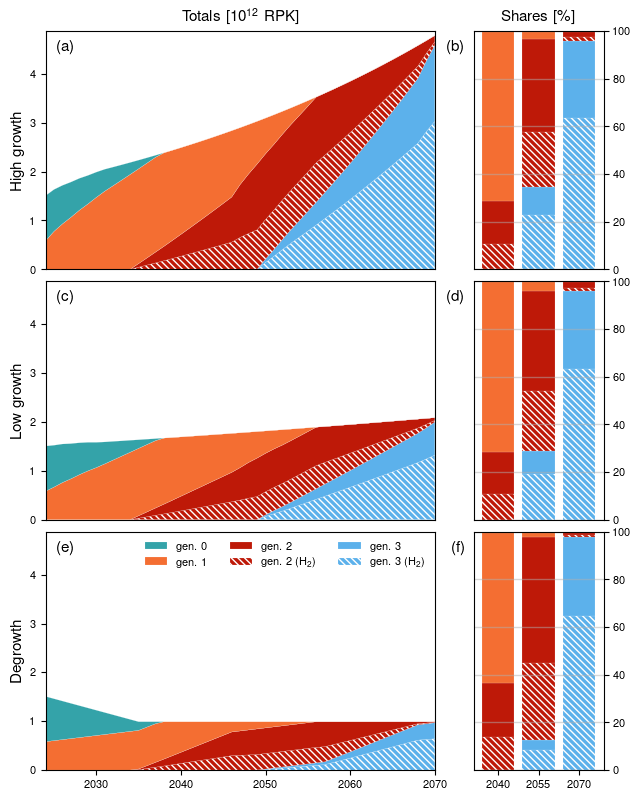

In [9]:
fig_name = 'Fig2_fleet_composition'
nrows = 3
ncols = 2
fig, axs = plt.subplots(nrows,ncols,gridspec_kw={'width_ratios':[3,1],'height_ratios':[1,1,1]},figsize = (plot_width,plot_width*4/3))

labels = [['(a)','(b)'],['(c)','(d)'],['(e)','(f)']]
style_list = ['','','','\\\\\\\\\\','','\\\\\\\\\\'][::-1]
y_labels = ['High growth', 'Low growth', 'Degrowth']

# specify how to plot bar charts of relative shares
bar_width = 12
target_years = [2040, 2055, 2070]
year_indices = [years_graph.index(year) for year in target_years]

# process data & figure out how to set y-axis later
scenarios_fleet_results_max = 0
for scenario in scenarios:
    # calculate RPK provided per AC generation including fuel type
    fleet_results_temp                  = scenario['RPK per AC'].copy().fillna(0)
    fleet_results_temp['gen. 0']        = fleet_results_temp['Original NB'] + fleet_results_temp['Original WB']
    fleet_results_temp['gen. 1']        = fleet_results_temp['New NB'] + fleet_results_temp['New WB']
    fleet_results_temp['gen. 2']        = fleet_results_temp['Upcoming NB'] + fleet_results_temp['Upcoming WB']
    fleet_results_temp['gen. 2 (H$_2$)'] = fleet_results_temp['H$_2$ 1$^{st}$ gen. NB']
    fleet_results_temp['gen. 3']        = fleet_results_temp['Future NB'] + fleet_results_temp['Future WB']
    fleet_results_temp['gen. 3 (H$_2$)'] = fleet_results_temp['H$_2$ 2$^{nd}$ gen. NB'] + fleet_results_temp['H$_2$ 1$^{st}$ gen. WB']
    fleet_results_temp.drop(['Original NB', 'Original WB', 'New NB', 'New WB', 'Upcoming NB', 'Upcoming WB', 'Future NB', 'Future WB', 'H$_2$ 1$^{st}$ gen. NB', 'H$_2$ 2$^{nd}$ gen. NB', 'H$_2$ 1$^{st}$ gen. WB'], axis=1, inplace=True)
    scenario['RPK by gen. & fuel type'] = fleet_results_temp/1e12

    max_here = scenario['RPK by gen. & fuel type'].sum(axis=1).max()
    if max_here > scenarios_fleet_results_max: scenarios_fleet_results_max = max_here

# initiate loop for plotting the desired scenarios
n = 0
for scenario in scenarios:
# only plot data for the scenarios with H2 aircraft
    if scenario['name AAF'] != 'ReFuelEU extended, \n with H$_2$ AC': continue
    
    # plot stacked area chart
    ax_here = axs[n,0]
    stacks_here = ax_here.stackplot(years_graph, scenario['RPK by gen. & fuel type'].T[::-1], colors=colours_ac_fleet[::-1], labels=scenario['RPK by gen. & fuel type'].columns.tolist()[::-1], alpha = alpha, linewidth=0.1)

    # subplot adjustments
    ax_here.set_ylim(0,scenarios_fleet_results_max*1.02)
    ax_here.set_xlim(2024,2070)
    ax_here.text(.03, .96, labels[n][0], ha='left', va='top', transform=ax_here.transAxes, fontweight=subplot_fontweight, fontsize=subplot_fontsize)
    ax_here.set_ylabel(y_labels[n], fontweight=subplot_fontweight, fontsize=subplot_fontsize)
    if n != 2:
        ax_here.tick_params(axis='x', which='both', bottom=False, labelbottom=False)
        
    k = 0
    for stack in stacks_here:
        stack.set_hatch(style_list[k])
        stack.set_edgecolor('#FFFFFF')
        k += 1

    # plot relative shares for set years
    ax_here = axs[n, 1]

    # extract the values for the target years
    share_data = scenario['RPK by gen. & fuel type'].iloc[year_indices]
    share_data = share_data.div(share_data.sum(axis=1), axis=0) * 100  # convert to percentage

    bottoms = np.zeros(len(target_years))
    for idx, column in enumerate(share_data.columns[::-1]):
        values = share_data[column].values
        ax_here.bar(target_years, values, bottom=bottoms, color=colours_ac_fleet[::-1][idx],
                    hatch=style_list[idx], edgecolor='#FFFFFF', label=column, linewidth=0.1, width=bar_width)
        bottoms += values

    # subplot adjustments
    ax_here.set_ylim(0, 100)
    ax_here.set_xlim(target_years[0] - bar_width*0.75, target_years[-1] + bar_width*0.75)
    ax_here.set_xticks(target_years)
    ax_here.text(-.06, .96, labels[n][1], ha='right', va='top', transform=ax_here.transAxes, fontweight=subplot_fontweight, fontsize=subplot_fontsize)
    ax_here.tick_params(axis='y', right=True, labelright=True, left=False, labelleft=False)
    ax_here.grid(axis='y', linestyle='-', linewidth=1, alpha=0.5)
    if n != 2:
        ax_here.tick_params(axis='x', which='both', bottom=False, labelbottom=False)

    n += 1

# add titles above subplots
axs[0,0].set_title('Totals [${10^{12}}$ RPK]', fontweight=subplot_fontweight, fontsize=subplot_fontsize)
axs[0,1].set_title('Shares [\%]', fontweight=subplot_fontweight, fontsize=subplot_fontsize)

# make legend
handles, labels = ax_here.get_legend_handles_labels()
axs[2,0].legend(handles[::-1], labels[::-1], loc='upper right', bbox_to_anchor=(1, 1), ncol=3, frameon=False)

plt.subplots_adjust(wspace=0.15, hspace=0.05)

# save figure
figure_name = folder_figures+fig_name+'.pdf'
fig.savefig(figure_name,bbox_inches='tight')
figure_name = folder_figures+fig_name+'.png'
fig.savefig(figure_name,bbox_inches='tight',dpi=600)

# record the data for all main text scenarios, not just the ones plotted
data = {
    "Year": years_graph
}
# add timeline data first
for scenario in scenarios:
    stack_data = scenario['RPK by gen. & fuel type'].T
    stack_columns = scenario['RPK by gen. & fuel type'].columns.tolist()
    for column_name in stack_columns:
        column_data = scenario['RPK by gen. & fuel type'][column_name]
        column_name = column_name.replace('$_2$', '2')

        data[f"{scenario['name for .csv']} - {column_name}"] = column_data.reset_index(drop=True)
# next, add data for relative shares
for scenario in scenarios:
    share_data = scenario['RPK by gen. & fuel type']
    share_data = share_data.div(share_data.sum(axis=1), axis=0) * 100  # convert to percentage
    share_columns = share_data.columns.tolist()
    for column_name in share_columns:
        column_data = share_data[column_name]
        column_name = column_name.replace('$_2$', '2')
        data[f"{scenario['name for .csv']} - {column_name} relative share"] = column_data
# save data
df = pd.DataFrame(data)
csv_file_name = folder_csvs+fig_name+'.csv'
df.to_csv(csv_file_name, index=False)

Plot fuel use and hydrogen production for selected scenarios.

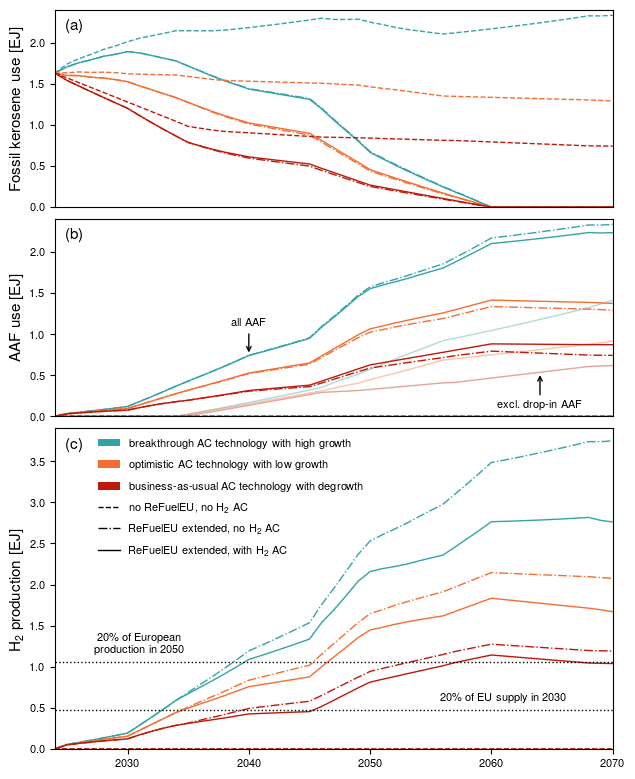

In [10]:
fig_name = 'Fig3_results_fuels'
xmin, xmax = [2024,2070]
ymin, ymax = [0,2.4]
ymax_h2 = 3.9
fig, axs = plt.subplots(3,1,figsize = (plot_width,plot_width*4/3), gridspec_kw={'height_ratios':[ymax, ymax, ymax_h2]})

data = {
    "Year": years_graph
}
for scenario in scenarios:
    axs[0].plot(years_graph, scenario['fossil kerosene [EJ]'], linestyle=scenario['line style'], color=scenario['colour'], lw = 1, alpha = alpha)
    axs[1].plot(years_graph, scenario['AAF total [EJ]'], linestyle=scenario['line style'], color=scenario['colour'], lw = 1, alpha = alpha)
    axs[1].plot(years_graph, scenario['hydrogen fuel [EJ]'], linestyle=scenario['line style'], color=scenario['colour'], lw = 1, alpha = 0.4)
    axs[2].plot(years_graph, scenario['hydrogen production [EJ]'], linestyle=scenario['line style'], color=scenario['colour'], lw = 1, alpha = alpha)

    ac_name = scenario['name base'].replace('\n ','')
    fuel_name = scenario['name AAF'].replace('\n ','').replace('$_2$','2')
    scenario_name = f"{ac_name}, {fuel_name}"
    data[f"Fossil kerosene use [EJ] - {scenario_name}"] = scenario['fossil kerosene [EJ]']
    data[f"AAF use [EJ] - {scenario_name}"] = scenario['AAF total [EJ]']
    data[f"H2 production [EJ] - {scenario_name}"] = scenario['hydrogen production [EJ]']

axs[0].set_ylabel('Fossil kerosene use [EJ]', fontweight=subplot_fontweight, fontsize=subplot_fontsize)
axs[1].set_ylabel('AAF use [EJ]', fontweight=subplot_fontweight, fontsize=subplot_fontsize)
axs[2].set_ylabel('H$_2$ production [EJ]', fontweight=subplot_fontweight, fontsize=subplot_fontsize)
axs[0].set_ylim(ymin, ymax) 
axs[1].set_ylim(ymin, ymax) 
axs[2].set_ylim(ymin, ymax_h2) 
axs[0].set_xlim(xmin, xmax)
axs[1].set_xlim(xmin, xmax)
axs[2].set_xlim(xmin, xmax)
axs[0].text(.02, .95, '(a)', ha='left', va='top', transform=axs[0].transAxes, fontweight=subplot_fontweight, fontsize=subplot_fontsize)
axs[1].text(.02, .95, '(b)', ha='left', va='top', transform=axs[1].transAxes, fontweight=subplot_fontweight, fontsize=subplot_fontsize)
axs[2].text(.02, 1 - (1-.95)*ymax/ymax_h2, '(c)', ha='left', va='top', transform=axs[2].transAxes, fontweight=subplot_fontweight, fontsize=subplot_fontsize)
axs[0].tick_params(axis='x', which='both', bottom=False, labelbottom=False)
axs[1].tick_params(axis='x', which='both', bottom=False, labelbottom=False)

#120 MJ/kg --> EJ/Mton 10e12/10e9
h2_energy_density = 120   # EJ/Mton
vol_2050_nze    = 44.102*1e9*h2_energy_density/1e12    # Mton in NZE scenario
vol_2030_eu     = 20*1e9*h2_energy_density/1e12        # Mton in NZE scenario
dx = 0.1
axs[2].axhline(y = vol_2050_nze*0.2, linestyle = ':', color = '#000000', lw = 1, alpha = alpha)
axs[2].axhline(y = vol_2030_eu*0.2, linestyle = ':', color = '#000000', lw = 1, alpha = alpha)
axs[2].annotate('20\% of European \n production in 2050', xy = [2031, vol_2050_nze*0.2 + dx], xytext = [2031, vol_2050_nze*0.2 + dx], ha='center', fontsize=annotation_fontsize)
axs[2].annotate('20\% of EU supply in 2030', xy = [2061, vol_2030_eu*0.2 + dx], xytext = [2061, vol_2030_eu*0.2 + dx], ha='center', fontsize=annotation_fontsize)

# annotate H2-only line of panel (b)
tate_loc_h2 = 2064
tate_loc_all = 2040
axs[1].annotate('excl. drop-in AAF', xy = [tate_loc_h2, scenarios[-1]['hydrogen fuel [EJ]'][years_graph.index(tate_loc_h2)]], xytext = [tate_loc_h2, 0.1], arrowprops = dict(arrowstyle='->'), ha='center', fontsize=annotation_fontsize)
axs[1].annotate('all AAF', xy = [tate_loc_all, scenarios[1]['AAF total [EJ]'][years_graph.index(tate_loc_all)]], xytext = [tate_loc_all, 1.1], arrowprops = dict(arrowstyle='->'), ha='center', fontsize=annotation_fontsize)

# make legend
labels, handles, handler_map = make_legend_timeline(scenarios)
by_label = dict(zip(labels, handles))
axs[2].legend(by_label.values(), by_label.keys(), handler_map=handler_map, loc='upper left', bbox_to_anchor=(0.06, 1), ncol=1, frameon=False, labelspacing=1)

plt.subplots_adjust(hspace=0.05)

# save figure
figure_name = folder_figures+fig_name+'.pdf'
fig.savefig(figure_name,bbox_inches='tight')
figure_name = folder_figures+fig_name+'.png'
fig.savefig(figure_name,bbox_inches='tight',dpi=600)

# save data
keys_keep = list(data.keys())[:1]
keys_sorted = sorted(list(data.keys())[1:])
keys_new = keys_keep + keys_sorted
data_new = {key: data[key] for key in keys_new}
df = pd.DataFrame(data_new)

csv_file_name = folder_csvs+fig_name+'.csv'
df.to_csv(csv_file_name, index=False) 

Plot $CO_{2}$ & RF results for selected scenarios.

In [11]:
def plot_results_impacts(fig_name, impact_co2, impact_total, impact_target, co2_label, total_label, target_label, yaxis_label, impact_plot_scale=1):
    fig, (ax1, ax2) = plt.subplots(2,1,gridspec_kw={'height_ratios':[1,2]},figsize = (plot_width,plot_width*4/3))
    ax1.plot(years_graph, np.array(max_line)/1e9, linestyle=':', color='#000000', lw = 2, alpha = 1)
    ax2.plot(years_graph, impact_target*impact_plot_scale, linestyle=':', color='#000000', lw = 2, alpha = 1)

    data = {
        "Year": years_graph,
        "Target CO2 emissions [kg]": np.array(max_line),
        target_label: list(impact_target),
    }
    for scenario in scenarios:
        ax1.plot(years_graph, scenario['CO2 emissions [Mton]'], linestyle=scenario['line style'], color=scenario['colour'], lw = 1, alpha = alpha)
        ax2.plot(years_graph, scenario[impact_co2]*impact_plot_scale, linestyle=scenario['line style'], color=scenario['colour'], lw = 1, alpha = alpha)
        ax2.plot(years_graph, scenario[impact_total]*impact_plot_scale, linestyle=scenario['line style'], color=scenario['colour'], lw = 1, alpha = 0.4)

        data[f"CO2 emissions [kg] - {scenario['name for .csv']}"] = scenario['CO2 emissions [Mton]'].reset_index(drop=True)*1e9 # convert from Mton back to kg
        data[f"{co2_label} - {scenario['name for .csv']}"] = list(scenario[impact_co2])
        data[f"{total_label} - {scenario['name for .csv']}"] = list(scenario[impact_total])

    ax1.text(.02, .95, '(a)', ha='left', va='top', transform=ax1.transAxes, fontweight=subplot_fontweight, fontsize=subplot_fontsize)
    ax2.text(.02, 1 - (1-.95)/2, '(b)', ha='left', va='top', transform=ax2.transAxes, fontweight=subplot_fontweight, fontsize=subplot_fontsize)

    ax1.set_ylabel('CO$_2$ emissions [Mton]', fontweight=subplot_fontweight, fontsize=subplot_fontsize)
    ax2.set_ylabel(yaxis_label, fontweight=subplot_fontweight, fontsize=subplot_fontsize)

    co2_annotate_point = list(scenarios[0][impact_co2])[years_graph.index(2030)] * impact_plot_scale
    nonco2_annotate_point = list(scenarios[0][impact_total])[years_graph.index(2060)] * impact_plot_scale
    co2_annotate_text = co2_annotate_point + (list(scenarios[8][impact_total])[years_graph.index(2030)] * impact_plot_scale - co2_annotate_point) / 3
    nonco2_annotate_text = nonco2_annotate_point - (nonco2_annotate_point - list(scenarios[3][impact_total])[years_graph.index(2060)] * impact_plot_scale) / 3
    ax2.annotate('CO$_2$ only', xy = [2030, co2_annotate_point], xytext = [2030, co2_annotate_text], arrowprops = dict(arrowstyle='->'), ha='center', fontsize=annotation_fontsize)
    ax2.annotate('incl. non-CO$_2$ effects', xy = [2060, nonco2_annotate_point], xytext = [2060, nonco2_annotate_text], arrowprops = dict(arrowstyle='->'), ha='center', fontsize=annotation_fontsize)

    ax1.set_ylim(bottom=0)  
    ax2.set_ylim(bottom=0)  
    ax1.set_xlim(2024,2070)
    ax2.set_xlim(2024,2070)
    ax1.tick_params(axis='x', which='both', bottom=False, labelbottom=False)

    # make legend
    labels, handles, handler_map = make_legend_timeline(scenarios)
    labels.append('ICAO/IATA CO$_2$ limit')
    handles.append(Line2D([0,1],[0,1],linestyle=':', color='#000000', lw=2))
    by_label = dict(zip(labels, handles))
    ax2.legend(by_label.values(), by_label.keys(), handler_map=handler_map, loc='upper left', bbox_to_anchor=(0.06, 1), ncol=1, frameon=False, labelspacing=1)

    plt.subplots_adjust(hspace=0.03)

    # save figure
    figure_name = folder_figures+fig_name+'.pdf'
    fig.savefig(figure_name,bbox_inches='tight')
    figure_name = folder_figures+fig_name+'.png'
    fig.savefig(figure_name,bbox_inches='tight',dpi=300)

    # save figure data
    keys_keep = list(data.keys())[:3]
    keys_sorted = sorted(list(data.keys())[3:])
    keys_new = keys_keep + keys_sorted
    data_new = {key: data[key] for key in keys_new}
    df = pd.DataFrame(data_new)

    csv_file_name = folder_csvs+fig_name+'.csv'
    df.to_csv(csv_file_name, index=False)

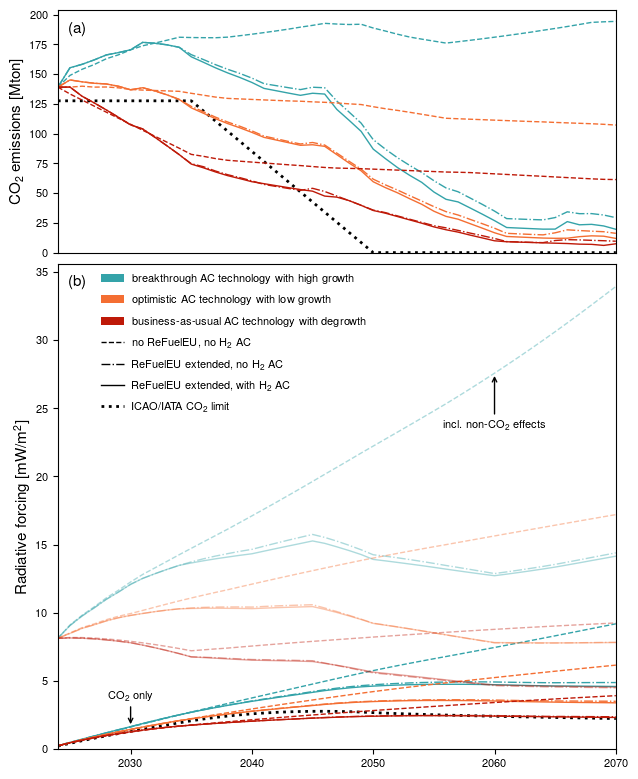

In [12]:
fig_name = 'Fig4_results_impacts_LWE'
impact_co2 = 'RF, CO2 only'
impact_total = 'RF'
impact_target = RF_CO2_target
co2_label = "CO2 RF [mW m-2]"
total_label = "Total RF [mW m-2]"
target_label = "Target CO2 RF [mW m-2]"
yaxis_label = "Radiative forcing [mW/m${^{2}}$]"
plot_results_impacts(fig_name, impact_co2, impact_total, impact_target, co2_label, total_label, target_label, yaxis_label)

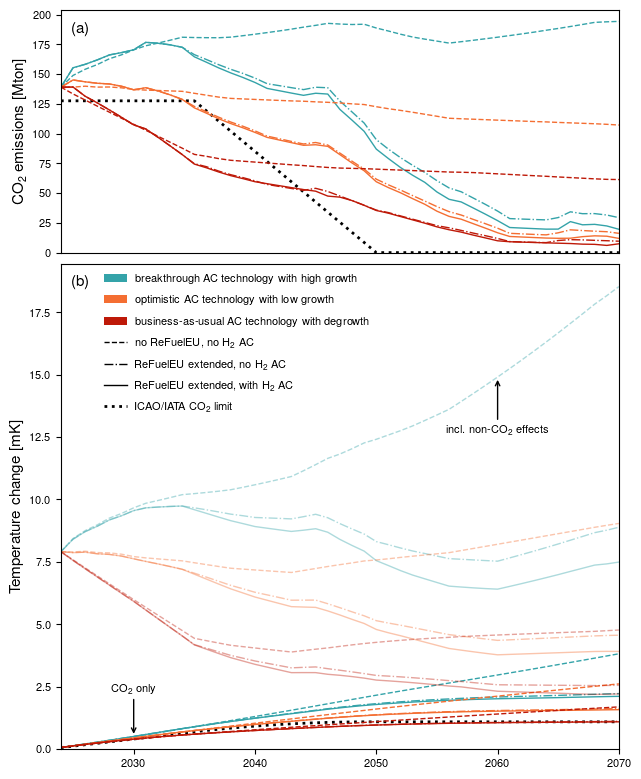

In [13]:
fig_name = 'Fig4_results_impacts_GWPstar_extra'
impact_co2 = 'dT, CO2 only'
impact_total = 'dT'
impact_target = dT_CO2_target
co2_label = "Temperature change from CO2 emissions [K]"
total_label = "Temperature change [K]"
target_label = "Target CO2 dT [K]"
yaxis_label = "Temperature change [mK]"
impact_plot_scale = 1e3
plot_results_impacts(fig_name, impact_co2, impact_total, impact_target, co2_label, total_label, target_label, yaxis_label, impact_plot_scale)

Plot all alternative impact categories for selected scenarios.

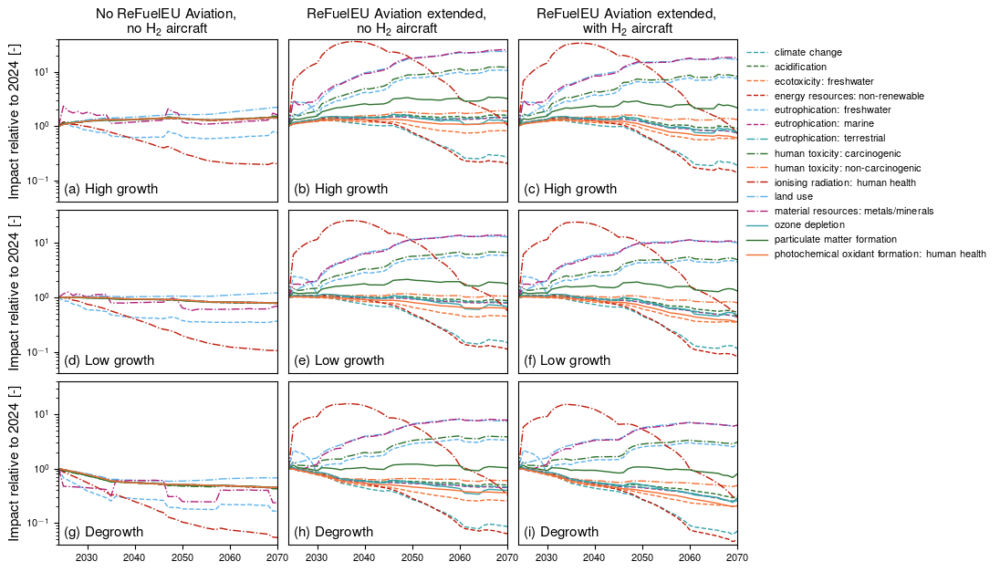

In [14]:
fig_name = 'Xfig_impact_categories_normalised'
nrows = 3
ncols = 3

style_list = []
for line in linestyles:
    for colour in colours:
        style_list.append([line,colour])

fig, axs = plt.subplots(nrows,ncols,figsize = (plot_width*4/3, plot_width))
label_counter = 0
labels = ['(a) High growth', '(b) High growth','(c) High growth','(d) Low growth','(e) Low growth','(f) Low growth','(g) Degrowth','(h) Degrowth','(i) Degrowth']
y_labels = ['Impact relative to 2024 [-]', 'Impact relative to 2024 [-]', 'Impact relative to 2024 [-]']
x_labels = ['No ReFuelEU Aviation, \n no H$_2$ aircraft','ReFuelEU Aviation extended, \n no H$_2$ aircraft', 'ReFuelEU Aviation extended, \n with H$_2$ aircraft']

k = 0
data = {
    "Year": years_graph
}
for scenario in scenarios:
    i = k // nrows
    j = k % ncols
    ax_here = axs[i][j]
    LCIA_df = scenario['LCIA DataFrame']
    LCIA_df_norm = LCIA_df/LCIA_df.iloc[0]
    LCIA_df_norm_selection = LCIA_df_norm.iloc[:,:15]

    # loop through impact categories
    counter = 0
    for name, values in LCIA_df_norm_selection.items():
        ax_here.plot(years, values, label=name, linestyle=style_list[counter][0], color=style_list[counter][1], lw = 1)
        counter += 1
        # add to figure data
        data[f"{scenario['name for .csv']} - {name} [-]"] = values.reset_index(drop=True)
    ax_here.set_xlim(2024,2070)
    ax_here.set_ylim(0.04,40)
    ax_here.set_yscale('log')
    ax_here.text(.03, .03, labels[label_counter], ha='left', va='bottom', transform=axs[i][j].transAxes, fontweight=subplot_fontweight, fontsize=subplot_fontsize)
    label_counter += 1
    if i != 2: ax_here.tick_params(axis='x', which='both', bottom=False, labelbottom=False)
    if i == 0: 
        ax_here.set_xlabel(x_labels[j], fontweight=subplot_fontweight, fontsize=subplot_fontsize, labelpad=4)
        ax_here.xaxis.set_label_position('top')
    if j != 0: 
        ax_here.tick_params(axis='y', which='both', left=False, labelleft=False)
    else:
        ax_here.set_ylabel(y_labels[i], fontweight=subplot_fontweight, fontsize=subplot_fontsize)
    k += 1

axs[0][2].legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1, frameon=False)

plt.subplots_adjust(wspace=0.05, hspace=0.05, top=0.88)
figure_name = folder_figures+fig_name+'.pdf'
fig.savefig(figure_name,bbox_inches='tight')
figure_name = folder_figures+fig_name+'.png'
fig.savefig(figure_name,bbox_inches='tight',dpi=600)

# save figure data
df = pd.DataFrame(data)
csv_file_name = folder_csvs+fig_name+'.csv'
df.to_csv(csv_file_name, index=False)

Plot selected alternative impact categories in a 4x4 grid for selected scenarios.

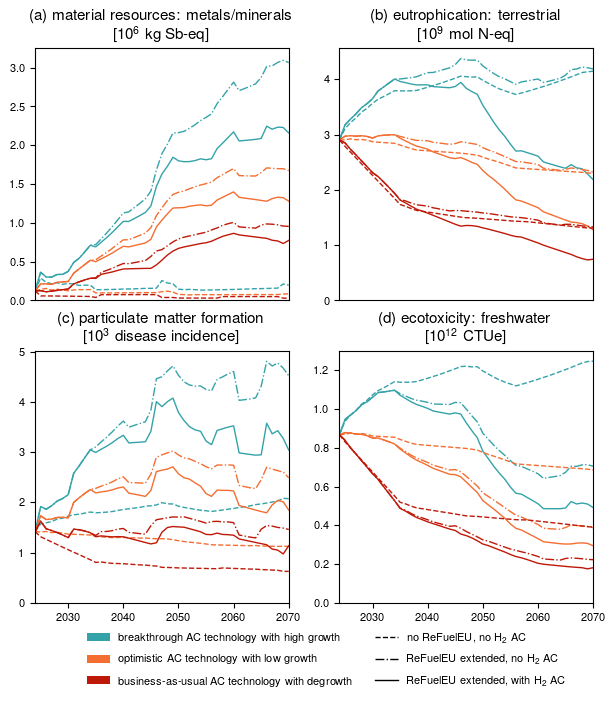

In [15]:
# eutrophication: terrestrial
# material resources: metals/minerals
# particulate matter formation
# ecotoxicity: freshwater
fig_name = 'Xfig_selected_impact_categories'
fig, axs = plt.subplots(2,2,figsize = (plot_width, plot_width))
labels = ['(a)','(b)','(c)','(d)']
scales = [6,9,3,12]
units = ['kg Sb-eq','mol N-eq','disease incidence','CTUe']
impact_cat_selected = ['material resources: metals/minerals', 'eutrophication: terrestrial', 'particulate matter formation', 'ecotoxicity: freshwater']
impact_cat_counter = 0
# (creating data for figure at the same time)
data = {
    "Year": years_graph
}
for a in range(2):
    for b in range(2):
        ax_here = axs[a][b]
        scales_here = scales[impact_cat_counter]
        impact_cat_here = impact_cat_selected[impact_cat_counter]
        ax_here.set_xlabel(labels[impact_cat_counter]+' '+impact_cat_here+'\n [$10^{'+str(scales_here)+'}$ '+units[impact_cat_counter]+']', fontweight=subplot_fontweight, fontsize=subplot_fontsize, labelpad=6)
        ax_here.xaxis.set_label_position('top') 
        for scenario in scenarios:
            ax_here.plot(years, scenario['LCIA DataFrame'][impact_cat_here]/(10**scales_here), linestyle=scenario['line style'], color=scenario['colour'], lw = 1, alpha = alpha)
            # add to figure data
            data[f"{scenario['name for .csv']} - {impact_cat_here} [{units[impact_cat_counter]}]"] = scenario['LCIA DataFrame'][impact_cat_here].reset_index(drop=True)
        if a != 1: ax_here.tick_params(axis='x', which='both', bottom=False, labelbottom=False)
        ax_here.set_xlim(2024,2070)
        ax_here.set_ylim(bottom=0)
        impact_cat_counter += 1 
# make legend
labels, handles, handler_map = make_legend_timeline(scenarios)
by_label = dict(zip(labels, handles))  
axs[1][1].legend(by_label.values(), by_label.keys(), handler_map=handler_map, loc='upper center', bbox_to_anchor=(-0.05, -0.08), ncol=2, frameon=False, labelspacing=1)

# save figure & data
figure_name = folder_figures+fig_name+'.pdf'
fig.savefig(figure_name,bbox_inches='tight')
figure_name = folder_figures+fig_name+'.png'
fig.savefig(figure_name,bbox_inches='tight',dpi=600)
df = pd.DataFrame(data)
csv_file_name = folder_csvs+fig_name+'.csv'
df.to_csv(csv_file_name, index=False)

Plot figures breaking down performance of scenarios into $CO_2$/MJ, MJ/RPK, and $CO_2$/RPK.

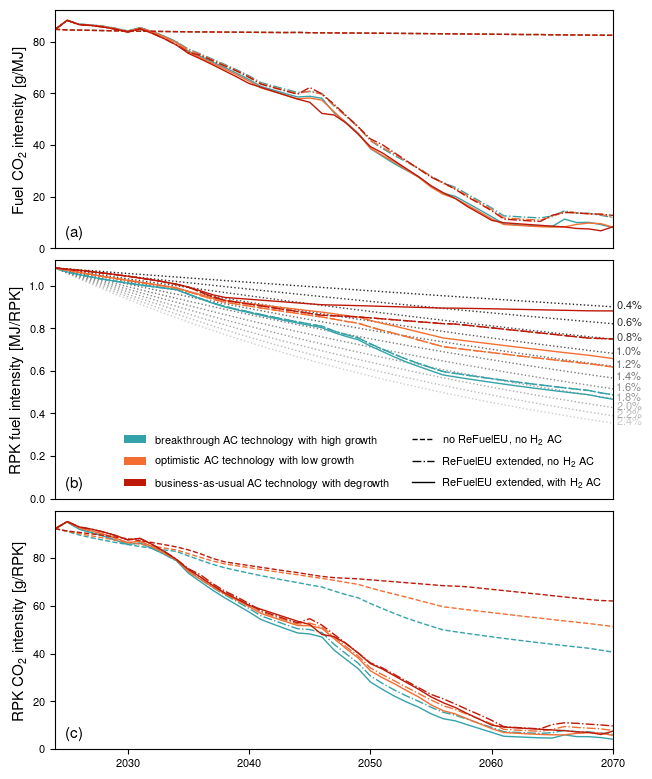

In [16]:
fig_name = 'Xfig_relative_performance'
# (creating data for figure at the same time)
data = {
    "Year": years_graph
}
fig, axs = plt.subplots(3,1,gridspec_kw={'height_ratios':[1,1,1]},figsize =(plot_width, plot_width*4/3))
let_labels = ['(a)','(b)','(c)']
y_labels = ['Fuel CO$_2$ intensity [g/MJ]', 'RPK fuel intensity [MJ/RPK]', 'RPK CO$_2$ intensity [g/RPK]']
# add scenario data
for scenario in scenarios:
    list_of_dic = scenario['list of dictionaries']
    total_fuel = scenario['fuels']
    first_plot_data = calculate_impact_per_mj(total_fuel, list_of_dic, 'Carbon dioxide')*1e3
    second_plot_data = total_fuel.sum(axis = 1)/scenario['RPK per AC'].sum(axis=1)
    third_plot_data = scenario['CO2 emissions [Mton]']*1e9*1e3/scenario['RPK per AC'].sum(axis=1)
    axs[0].plot(years_graph, first_plot_data, linestyle=scenario['line style'], color=scenario['colour'], lw = 1, alpha = alpha)
    axs[1].plot(years_graph, second_plot_data, linestyle=scenario['line style'], color=scenario['colour'], lw = 1, alpha = alpha)
    axs[2].plot(years_graph, third_plot_data, linestyle=scenario['line style'], color=scenario['colour'], lw = 1, alpha = alpha)
    # add to figure data
    scenario_name = scenario['name for .csv']
    data[f"Fuel CO2 intensity [g/MJ] - {scenario_name}"] = first_plot_data.reset_index(drop=True)
    data[f"RPK fuel intensity [MJ/RPK] - {scenario_name}"] = second_plot_data.reset_index(drop=True)
    data[f"RPK CO2 intensity [g/RPK] - {scenario_name}"] = third_plot_data.reset_index(drop=True)
# add reference lines to subplot b
for impr_rate in np.arange(0.4, 2.6, 0.2):
    reference_here = second_plot_data[0] * (1 - impr_rate/100) ** list(second_plot_data.index)
    alpha_here = 1 - impr_rate/3
    axs[1].plot(years_graph, reference_here, linestyle=':', color='#000000', lw=1, zorder=0, alpha=alpha_here)
    axs[1].annotate(f'{impr_rate:.1f}\%', xy = [years_graph[-1], reference_here[-1]], ha='left', va='center', fontsize=annotation_fontsize, alpha=alpha_here, xytext=(3,0), textcoords='offset points')

# add labels
for i in range(3):
    ax_here = axs[i]
    ax_here.set_ylabel(y_labels[i], fontweight=subplot_fontweight, fontsize=subplot_fontsize)        
    ax_here.text(0.02, 0.03, let_labels[i], ha='left', va='bottom', transform=ax_here.transAxes, fontweight=subplot_fontweight, fontsize=subplot_fontsize)
    ax_here.set_ylim(bottom=0)  
    ax_here.set_xlim(2024,2070)
    if i != 2: ax_here.tick_params(axis='x', which='both', bottom=False, labelbottom=False)

# make legend
labels, handles, handler_map = make_legend_timeline(scenarios)
by_label = dict(zip(labels, handles))  
axs[1].legend(by_label.values(), by_label.keys(), handler_map=handler_map, loc='lower right', bbox_to_anchor=(1,0), ncol=2, frameon=False, labelspacing=1)

# sort figure data
keys_keep = list(data.keys())[:1]
keys_sorted = sorted(list(data.keys())[1:])
keys_new = keys_keep + keys_sorted
data_new = {key: data[key] for key in keys_new}
df = pd.DataFrame(data_new)

# save figure image & data
plt.subplots_adjust(hspace=0.05)
figure_name = folder_figures+fig_name+'.pdf'
fig.savefig(figure_name,bbox_inches='tight')
figure_name = folder_figures+fig_name+'.png'
fig.savefig(figure_name,bbox_inches='tight',dpi=600)
csv_file_name = folder_csvs+fig_name+'.csv'
df.to_csv(csv_file_name, index=False)

Plot contributions to LWE, including 5-95% interval and sensitivity analysis for selected scenarios.

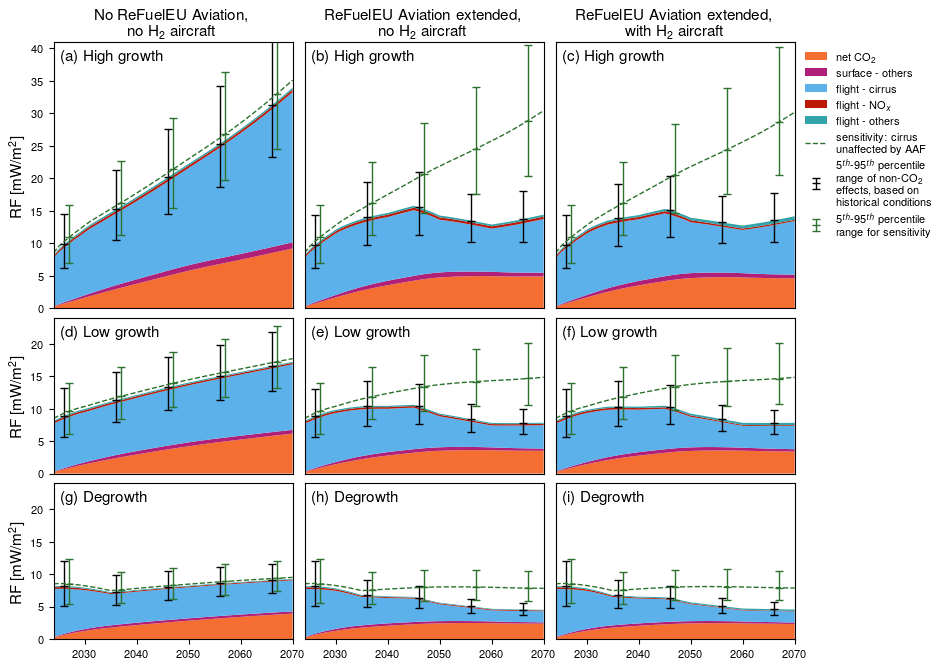

In [17]:
fig_name = 'Xfig_LWE_substance_contribution_analysis'

lwe_colours = [LU_orange, LU_violet, LU_light_blue, LU_red, LU_turqoise]
sens_colour = LU_green

nrows = 3
ncols = 3
y_lims = [41, 24, 24] # [41, 24, 19]

fig, axs = plt.subplots(nrows,ncols,figsize = (plot_width*4/3, plot_width), height_ratios=(y_lims))
label_counter = 0
letter_labels = ['(a) High growth', '(b) High growth','(c) High growth','(d) Low growth','(e) Low growth','(f) Low growth','(g) Degrowth','(h) Degrowth','(i) Degrowth']
y_labels = ['RF [mW/m${^{2}}$]', 'RF [mW/m${^{2}}$]', 'RF [mW/m${^{2}}$]']
x_labels = ['No ReFuelEU Aviation, \n no H$_2$ aircraft','ReFuelEU Aviation extended, \n no H$_2$ aircraft', 'ReFuelEU Aviation extended, \n with H$_2$ aircraft']
data = {
    "Year": years_graph
}
k = 0
for scenario in scenarios:
    i = k // nrows
    j = k % ncols
    ax_here = axs[i][j]

    RF = scenario['RF DF']
    RF_low = scenario['RF DF, low']
    RF_high = scenario['RF DF, high']
    RF_sens = scenario['RF DF, sensitivity']
    RF_sens_low = scenario['RF DF, sensitivity, low']
    RF_sens_high = scenario['RF DF, sensitivity, high']

    labels = list(RF.columns)
    # add to DataFrame for .csv
    scenario_name = scenario['name for .csv']
    data[f"{scenario_name} - RF with middle efficacy, total [mW m-2]"] = RF.sum(axis = 1).reset_index(drop=True)
    data[f"{scenario_name} - RF with low-end efficacy, total [mW m-2]"] = RF_low.sum(axis = 1).reset_index(drop=True)
    data[f"{scenario_name} - RF with high-end efficacy, total [mW m-2]"] = RF_high.sum(axis = 1).reset_index(drop=True)
    for label in labels:
        data[f"{scenario_name} - RF with middle efficacy, contribution {label} [mW m-2]"] = RF[label].reset_index(drop=True)
        data[f"{scenario_name} - RF with low-end efficacy, contribution {label} [mW m-2]"] = RF_low[label].reset_index(drop=True)
        data[f"{scenario_name} - RF with high-end efficacy, contribution {label} [mW m-2]"] = RF_high[label].reset_index(drop=True)
    data[f"{scenario_name} - RF from sensitivity analysis, with middle efficacy, total [mW m-2]"] = RF_sens.sum(axis = 1).reset_index(drop=True)
    data[f"{scenario_name} - RF from sensitivity analysis, with low-end efficacy, total [mW m-2]"] = RF_sens_low.sum(axis = 1).reset_index(drop=True)
    data[f"{scenario_name} - RF from sensitivity analysis, with high-end efficacy, total [mW m-2]"] = RF_sens_high.sum(axis = 1).reset_index(drop=True)
    for label in labels:
        data[f"{scenario_name} - RF from sensitivity analysis, with middle efficacy, contribution {label} [mW m-2]"] = RF_sens[label].reset_index(drop=True)
        data[f"{scenario_name} - RF from sensitivity analysis, with low-end efficacy, contribution {label} [mW m-2]"] = RF_sens_low[label].reset_index(drop=True)
        data[f"{scenario_name} - RF from sensitivity analysis, with high-end efficacy, contribution {label} [mW m-2]"] = RF_sens_high[label].reset_index(drop=True)
    # once data is added to DataFrame for .csv, make adjustments for plotting
    for l in range(len(labels)):
        labels[l] = labels[l].replace('CO2', 'CO$_2$')
        labels[l] = labels[l].replace('NOx', 'NO$_x$')
        labels[l] = labels[l].replace('Others', 'others')
        labels[l] = labels[l].replace('Cirrus', 'cirrus')
    
    ax_here.stackplot(years_graph, RF.T, labels=labels, colors=lwe_colours)
    err_years = []
    lower = []
    upper = []
    mid = []
    sens_err_years = []
    sens_lower = []
    sens_upper = []
    sens_mid = []
    for year in years_graph:
        if year%5 == 1 and year%10 != 1:
            err_years.append(year)
            RF_here = RF.loc[year].sum()
            mid.append(RF_here)
            lower.append(RF_here - RF_low.loc[year].sum())
            upper.append(RF_high.loc[year].sum() - RF_here)
        if year%5 == 2 and year%10 != 2:
            sens_err_years.append(year)
            RF_sens_here = RF_sens.loc[year].sum()
            sens_mid.append(RF_sens_here)
            sens_lower.append(RF_sens_here - RF_sens_low.loc[year].sum())
            sens_upper.append(RF_sens_high.loc[year].sum() - RF_sens_here)
    
    ax_here.errorbar(err_years, mid, yerr=(lower, upper), fmt='_', color='#000000', capsize=3, lw = 1, alpha = alpha, label='5$^{th}$-95$^{th}$ percentile \n range of non-CO$_2$ \n effects, based on \n historical conditions')

    ax_here.plot(years_graph, RF_sens.sum(axis=1).values, color=sens_colour, lw = 1, linestyle = '--', label='sensitivity: cirrus \n unaffected by AAF')

    ax_here.errorbar(sens_err_years, sens_mid, yerr=(sens_lower, sens_upper), fmt='_', color=sens_colour, capsize=3, lw = 1, alpha = alpha, label='5$^{th}$-95$^{th}$ percentile \n range for sensitivity')

    ax_here.set_xlim(2024,2070)
    ax_here.set_ylim(0,y_lims[i])

    ax_here.text(.03, 1 - 0.05*y_lims[2]/y_lims[i], letter_labels[label_counter], ha='left', va='top', transform=ax_here.transAxes, fontweight=subplot_fontweight, fontsize=subplot_fontsize)
    label_counter += 1
    if i != 2: ax_here.tick_params(axis='x', which='both', bottom=False, labelbottom=False)
    if i == 0: 
        ax_here.set_xlabel(x_labels[j], fontweight=subplot_fontweight, fontsize=subplot_fontsize, labelpad=4)
        ax_here.xaxis.set_label_position('top')
    if j != 0: 
        ax_here.tick_params(axis='y', which='both', left=False, labelleft=False)
    else:
        ax_here.set_ylabel(y_labels[i], fontweight=subplot_fontweight, fontsize=subplot_fontsize)
    k += 1

axs[0][2].legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1, frameon=False)

fig.tight_layout()
plt.subplots_adjust(wspace=0.05, hspace=0.05, top=0.88)
figure_name = folder_figures+fig_name+'.pdf'
fig.savefig(figure_name,bbox_inches='tight')
figure_name = folder_figures+fig_name+'.png'
fig.savefig(figure_name,bbox_inches='tight',dpi=600)

# create and save figure data
keys_keep = list(data.keys())[:1]
keys_sorted = sorted(list(data.keys())[1:])
keys_new = keys_keep + keys_sorted
data_new = {key: data[key] for key in keys_new}
df = pd.DataFrame(data_new)

csv_file_name = folder_csvs+fig_name+'.csv'
df.to_csv(csv_file_name, index=False)

Plot contributions to GWP* for selected scenarios, including sensitivity analysis.

In [18]:
# prepare data for plotting
for scenario in scenarios:
    original_df = scenario['GWP* DF']

    # extract desired columns
    dT_columns = [
        "temperature_increase_from_co2_from_aviation",
        "temperature_increase_from_contrails_from_aviation",
        "temperature_increase_from_nox_short_term_o3_increase_from_aviation",
        "temperature_increase_from_nox_long_term_o3_decrease_from_aviation",
        "temperature_increase_from_nox_ch4_decrease_from_aviation",
        "temperature_increase_from_nox_stratospheric_water_vapor_decrease_from_aviation",
        "temperature_increase_from_soot_from_aviation",
        "temperature_increase_from_h2o_from_aviation",
        "temperature_increase_from_sulfur_from_aviation",
        "temperature_increase_from_ch4_from_aviation",
        "temperature_increase_from_h2_from_aviation",
        ]
    
    dT_df = original_df[dT_columns].copy()

    # group NOx columns into warming and cooling
    warming_nox_cols = ["temperature_increase_from_nox_short_term_o3_increase_from_aviation"]
    cooling_nox_cols = ["temperature_increase_from_nox_long_term_o3_decrease_from_aviation",
                        "temperature_increase_from_nox_ch4_decrease_from_aviation",
                        "temperature_increase_from_nox_stratospheric_water_vapor_decrease_from_aviation"]

    # sum NOx columns
    dT_df["temperature_increase_from_nox_warming"] = dT_df[warming_nox_cols].sum(axis=1)
    dT_df["temperature_increase_from_nox_cooling"] = dT_df[cooling_nox_cols].sum(axis=1)

    # group soot and sulphur into aerosols
    aerosols_cols = ["temperature_increase_from_soot_from_aviation",
                     "temperature_increase_from_sulfur_from_aviation"]

    # sum aerosol columns
    dT_df["temperature_increase_from_aerosols"] = dT_df[aerosols_cols].sum(axis=1)

    # drop redundant columns
    dT_df.drop(warming_nox_cols + cooling_nox_cols + aerosols_cols, axis=1, inplace=True)

    # rename remaining columns
    dT_df.rename(columns={
        'temperature_increase_from_co2_from_aviation': 'CO2',
        'temperature_increase_from_contrails_from_aviation': 'Cirrus',
        'temperature_increase_from_nox_warming': 'NOx, warming',
        'temperature_increase_from_nox_cooling': 'NOx, cooling',
        'temperature_increase_from_aerosols': 'Aerosols',
        'temperature_increase_from_h2o_from_aviation': 'H2O',
        'temperature_increase_from_ch4_from_aviation': 'CH4',
        'temperature_increase_from_h2_from_aviation': 'H2',
        }, inplace=True)
    
    # reorder columns
    dT_df = dT_df[['CO2',
                   'CH4',
                   'H2',
                   'Cirrus',
                   'NOx, warming',
                   'NOx, cooling',
                   'H2O',
                   'Aerosols',
                   ]]

    scenario['dT DF for contributions'] = dT_df

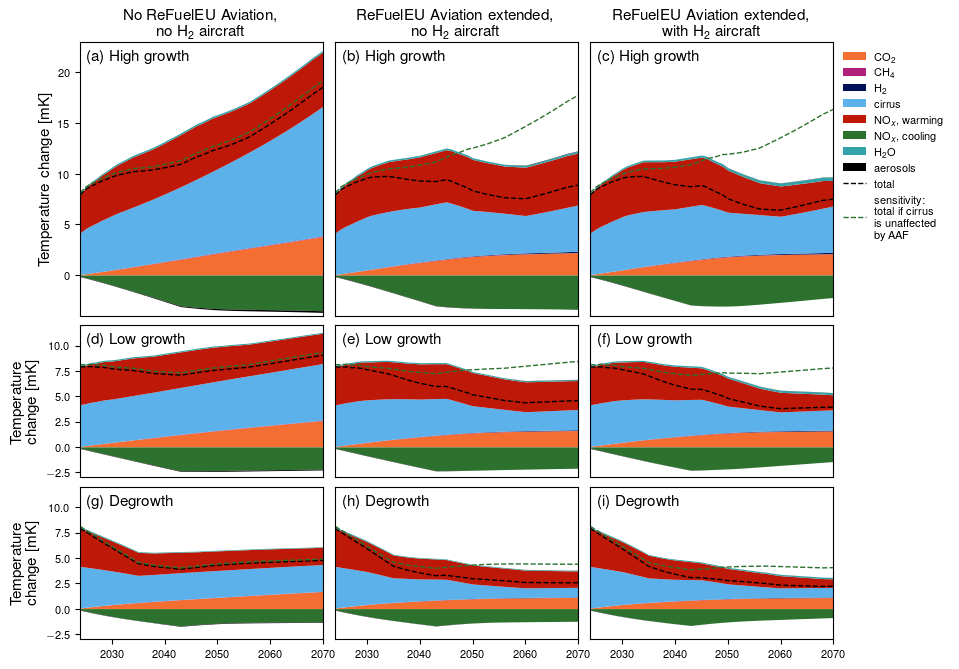

In [25]:
fig_name = 'Xfig_GWPstar_substance_contribution_analysis'

lwe_colours = [LU_orange, LU_violet, LU_blue, LU_light_blue, LU_red, LU_green, LU_turqoise, '#000000']

sens_colour = LU_green

nrows = 3
ncols = 3
y_lims = [23,12,12]
y_lims_bottom = [-4, -3, -3]
y_lims_range = [top - bot for top, bot in zip(y_lims, y_lims_bottom)]

fig, axs = plt.subplots(nrows,ncols,figsize = (plot_width*4/3, plot_width), height_ratios=(y_lims_range))
label_counter = 0
letter_labels = ['(a) High growth', '(b) High growth','(c) High growth','(d) Low growth','(e) Low growth','(f) Low growth','(g) Degrowth','(h) Degrowth','(i) Degrowth']
y_labels = ['Temperature change [mK]', 'Temperature \n change [mK]', 'Temperature \n change [mK]']
x_labels = ['No ReFuelEU Aviation, \n no H$_2$ aircraft','ReFuelEU Aviation extended, \n no H$_2$ aircraft', 'ReFuelEU Aviation extended, \n with H$_2$ aircraft']

# plot figures & record data in spreadsheet
data = {
    "Year": years_graph
}
k = 0
for scenario in scenarios:
    i = k // nrows
    j = k % ncols
    ax_here = axs[i][j]

    dT_df = scenario['dT DF for contributions']
    dT_total = scenario['dT']
    dT_sens = scenario['dT, sensitivity']

    labels = list(dT_df.columns)
    # add to DataFrame for .csv
    scenario_name = scenario['name for .csv']
    data[f"{scenario_name} - Temperature change, total [K]"] = dT_total.reset_index(drop=True)
    for label in labels:
        data[f"{scenario_name} - Temperature change, contribution {label} [K]"] = dT_df[label].reset_index(drop=True)
    data[f"{scenario_name} - Temperature change in sensitivity analysis, total [K]"] = dT_sens.reset_index(drop=True)
    # once data is added to DataFrame for .csv, make adjustments for plotting
    for l in range(len(labels)):
        labels[l] = labels[l].replace('CO2', 'CO$_2$')
        labels[l] = labels[l].replace('NOx', 'NO$_x$')
        labels[l] = labels[l].replace('CH4', 'CH$_4$')
        labels[l] = labels[l].replace('H2', 'H$_2$')
        labels[l] = labels[l].replace('Cirrus', 'cirrus')
        labels[l] = labels[l].replace('Aerosols', 'aerosols')
        
    pos_bottom = np.zeros_like(years_graph, dtype=float)
    neg_bottom = np.zeros_like(years_graph, dtype=float)
    for m, col in enumerate(dT_df.columns):
        y = dT_df[col] * 1e3

        # Separate positive and negative parts
        y_pos = y.where(y > 0, 0)
        y_neg = y.where(y < 0, 0)

        # plot positive
        ax_here.fill_between(
            years_graph,
            pos_bottom,
            pos_bottom + y_pos,
            color=lwe_colours[m],
            label=labels[m],
            linewidth=0,
        )
        pos_bottom += y_pos

        # plot negative
        ax_here.fill_between(
            years_graph,
            neg_bottom,
            neg_bottom + y_neg,
            color=lwe_colours[m],
            label=None,
            linewidth=0,
        )
        neg_bottom += y_neg

    ax_here.plot(years_graph, dT_total.values * 1e3, color='#000000', lw = 1, linestyle = '--', label='total')
    ax_here.plot(years_graph, dT_sens.values * 1e3, color=sens_colour, lw = 1, linestyle = '--', label='sensitivity: \n total if cirrus \n is unaffected \n by AAF')

    ax_here.set_xlim(2024,2070)
    ax_here.set_ylim(y_lims_bottom[i],y_lims[i])

    ax_here.text(.03, 1 - 0.05*y_lims_range[2]/y_lims_range[i], letter_labels[label_counter], ha='left', va='top', transform=ax_here.transAxes, fontweight=subplot_fontweight, fontsize=subplot_fontsize)
    label_counter += 1
    if i != 2: ax_here.tick_params(axis='x', which='both', bottom=False, labelbottom=False)
    if i == 0: 
        ax_here.set_xlabel(x_labels[j], fontweight=subplot_fontweight, fontsize=subplot_fontsize, labelpad=4)
        ax_here.xaxis.set_label_position('top')
    if j != 0: 
        ax_here.tick_params(axis='y', which='both', left=False, labelleft=False)
    else:
        ax_here.set_ylabel(y_labels[i], fontweight=subplot_fontweight, fontsize=subplot_fontsize)
    k += 1

axs[0][2].legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1, frameon=False)

fig.tight_layout()
plt.subplots_adjust(wspace=0.05, hspace=0.05, top=0.88)
figure_name = folder_figures+fig_name+'.pdf'
fig.savefig(figure_name,bbox_inches='tight')
figure_name = folder_figures+fig_name+'.png'
fig.savefig(figure_name,bbox_inches='tight',dpi=600)

# create and save figure data
keys_keep = list(data.keys())[:1]
keys_sorted = sorted(list(data.keys())[1:])
keys_new = keys_keep + keys_sorted
data_new = {key: data[key] for key in keys_new}
df = pd.DataFrame(data_new)

csv_file_name = folder_csvs+fig_name+'.csv'
df.to_csv(csv_file_name, index=False)

Plot contribution analysis to CO2 emissions for selected scenarios.

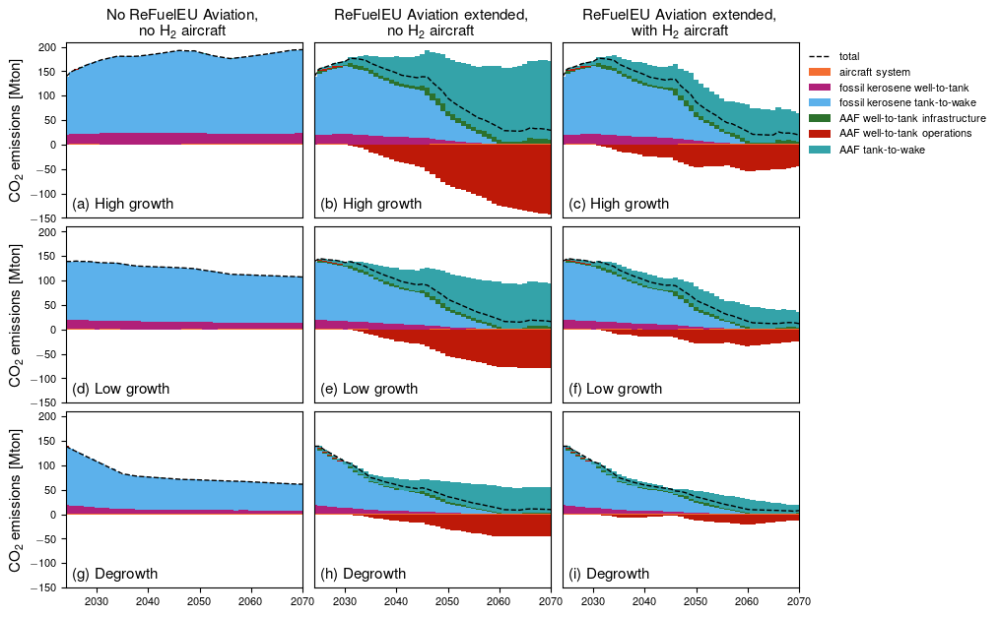

In [20]:
fig_name = 'Xfig_CO2_stage_contribution_analysis'
# (creating data for figure at the same time)
data = {
    "Year": years_graph
}
contr_colours = [LU_orange, LU_violet, LU_light_blue, LU_green, LU_red, LU_turqoise]
fig, axs = plt.subplots(3,3,figsize = (plot_width*4/3, plot_width))
label_counter = 0
letter_labels = ['(a) High growth', '(b) High growth','(c) High growth','(d) Low growth','(e) Low growth','(f) Low growth','(g) Degrowth','(h) Degrowth','(i) Degrowth']
y_labels = ['CO$_2$ emissions [Mton]', 'CO$_2$ emissions [Mton]', 'CO$_2$ emissions [Mton]']
x_labels = ['No ReFuelEU Aviation, \n no H$_2$ aircraft','ReFuelEU Aviation extended, \n no H$_2$ aircraft', 'ReFuelEU Aviation extended, \n with H$_2$ aircraft']

k = 0
for scenario in scenarios:
    i = k // nrows
    j = k % ncols
    ax_here = axs[i][j]

    list_of_dic = scenario['list of dictionaries']
    impact_cat = 'Carbon dioxide'
    plot_inflow = impact_cat_result(list_of_dic[0], impact_cat)
    plot_outflow = impact_cat_result(list_of_dic[1], impact_cat)
    plot_fossil_wtt = impact_cat_result(list_of_dic[2], impact_cat)
    plot_fossil_LTO_ttw = impact_cat_result(list_of_dic[3], impact_cat)
    plot_fossil_CCD_ttw = impact_cat_result(list_of_dic[4], impact_cat)
    plot_saf_wtt_infra = impact_cat_result(list_of_dic[5], impact_cat)
    plot_saf_wtt_ops = impact_cat_result(list_of_dic[6], impact_cat)
    plot_saf_LTO_ttw = impact_cat_result(list_of_dic[7], impact_cat)
    plot_saf_CCD_ttw = impact_cat_result(list_of_dic[8], impact_cat)
    plot_h2_wtt_infra = impact_cat_result(list_of_dic[9], impact_cat)
    plot_h2_wtt_ops = impact_cat_result(list_of_dic[10], impact_cat)
    plot_h2_LTO_ttw = impact_cat_result(list_of_dic[11], impact_cat)
    plot_h2_CCD_ttw = impact_cat_result(list_of_dic[12], impact_cat)
    
    combine_aircraft = plot_inflow + plot_outflow
    combine_wtt_infra = plot_saf_wtt_infra + plot_h2_wtt_infra
    combine_wtt_ops = plot_saf_wtt_ops + plot_h2_wtt_ops
    combine_ttw_fossil = plot_fossil_LTO_ttw + plot_fossil_CCD_ttw
    combine_ttw_aaf =  plot_saf_LTO_ttw + plot_h2_LTO_ttw + plot_saf_CCD_ttw + plot_h2_CCD_ttw
    
    contr_labels = ['year','aircraft system','fossil kerosene well-to-tank','fossil kerosene tank-to-wake','AAF well-to-tank infrastructure','AAF well-to-tank operations','AAF tank-to-wake']
    contr_stack = np.vstack([years_graph, combine_aircraft, plot_fossil_wtt, combine_ttw_fossil, combine_wtt_infra, combine_wtt_ops, combine_ttw_aaf])
    contr_df = pd.DataFrame(contr_stack.T/1e9, 
                        columns = contr_labels)  
    total_df = pd.DataFrame(np.vstack([years_graph,scenario['CO2 emissions [Mton]']]).T, 
                            columns= ['year','total'])
    total_df['year'] = total_df['year'].astype('string')
    contr_df.plot(x='year', kind="bar", stacked=True, ax=ax_here, legend=False, color=contr_colours, width=1)
    total_df.plot(x='year', kind="line", ax=ax_here, color='#000000', linestyle='--', lw=1, legend=False)
    
    # add to figure data
    scenario_name = scenario['name for .csv']
    data[f"{scenario_name} - CO2 emissions, total [kg]"] = total_df['total'].reset_index(drop=True)*1e9 # convert from Mton back to kg
    for label in list(contr_df.columns):
        if not label=='year': data[f"{scenario_name} - CO2 emissions, contribution {label} [kg]"] = contr_df[label].reset_index(drop=True)*1e9 # convert from Mton back to kg
    
    # configure image lay-out
    ax_here.set_xlim(0,46)
    ax_here.set_ylim(-150,210)
    
    pos = [6,16,26,36,46]
    l = [2030,2040,2050,2060,2070]
    ax_here.set(xticks=pos, xticklabels=l)
    
    ax_here.text(.03, .03, letter_labels[label_counter], ha='left', va='bottom', transform=ax_here.transAxes, fontweight=subplot_fontweight, fontsize=subplot_fontsize)
    label_counter += 1
    if i != 2: ax_here.tick_params(axis='x', which='both', bottom=False, labelbottom=False)            
    if i == 0: 
        ax_here.set_xlabel(x_labels[j], fontweight=subplot_fontweight, fontsize=subplot_fontsize, labelpad=4)
        ax_here.xaxis.set_label_position('top')
    else:
        ax_here.xaxis.label.set_visible(False)
    if j != 0: 
        ax_here.tick_params(axis='y', which='both', left=False, labelleft=False)
    else:
        ax_here.set_ylabel(y_labels[i], fontweight=subplot_fontweight, fontsize=subplot_fontsize)

    k += 1

axs[0][2].legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1, frameon=False)

# save figure image & data
plt.subplots_adjust(wspace=0.05, hspace=0.05, top=0.88)
figure_name = folder_figures+fig_name+'.pdf'
fig.savefig(figure_name,bbox_inches='tight')
figure_name = folder_figures+fig_name+'.png'
fig.savefig(figure_name,bbox_inches='tight',dpi=600)
df = pd.DataFrame(data)
csv_file_name = folder_csvs+fig_name+'.csv'
df.to_csv(csv_file_name, index=False) 

Plot heatmaps depicting emission targets for selected scenarios as well as sensitivity analyses.

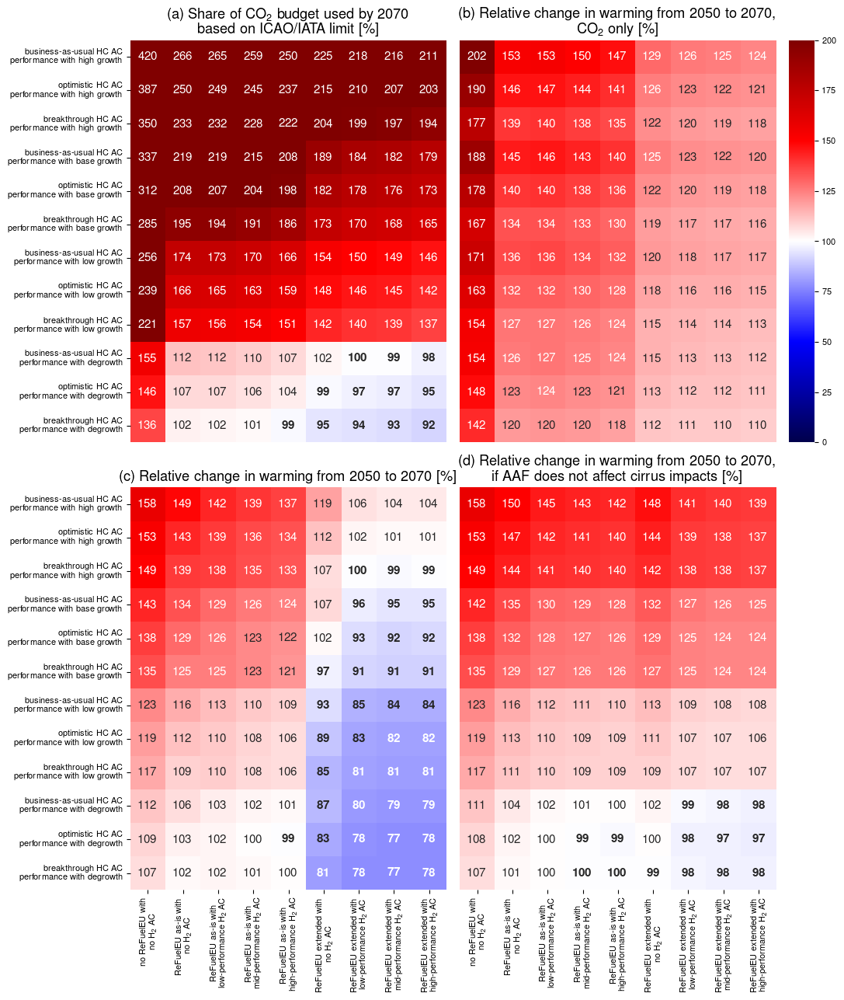

In [21]:
mode = 'GWPstar'
target = list(dT_CO2_target)

# create heatmaps to check emission targets
heat_map_df_1, heat_map_df_2, heat_map_df_3, heat_map_df_4 = make_target_heat_map(year_of_interest, flight_start_year, all_scenario_names, all_scenario_results, target, mode)
plot_target_heat_map(heat_map_df_1, heat_map_df_2, heat_map_df_3, heat_map_df_4, folder_figures, mode)

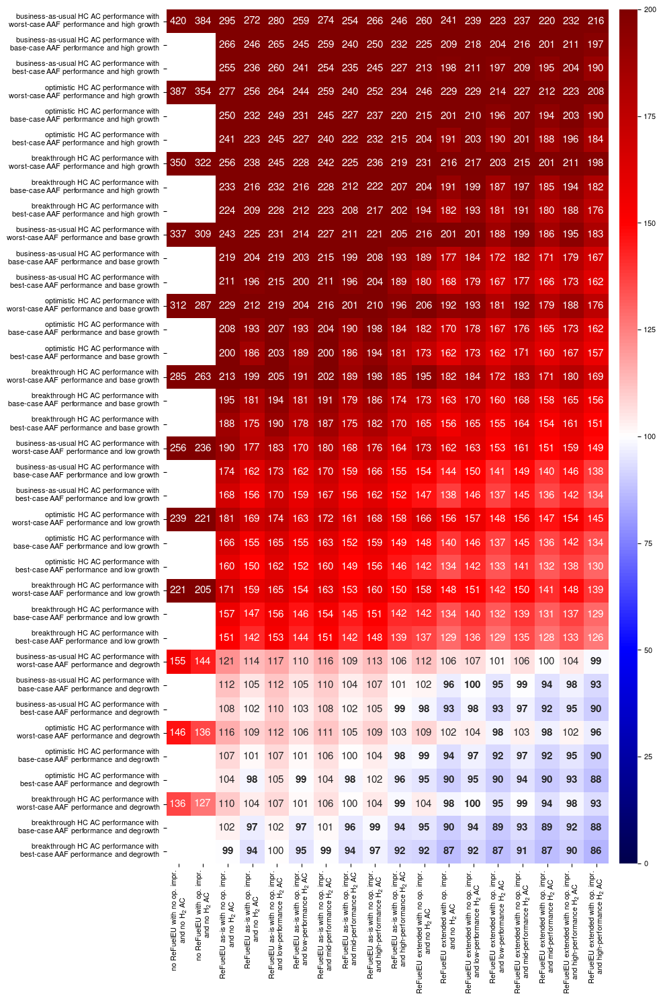

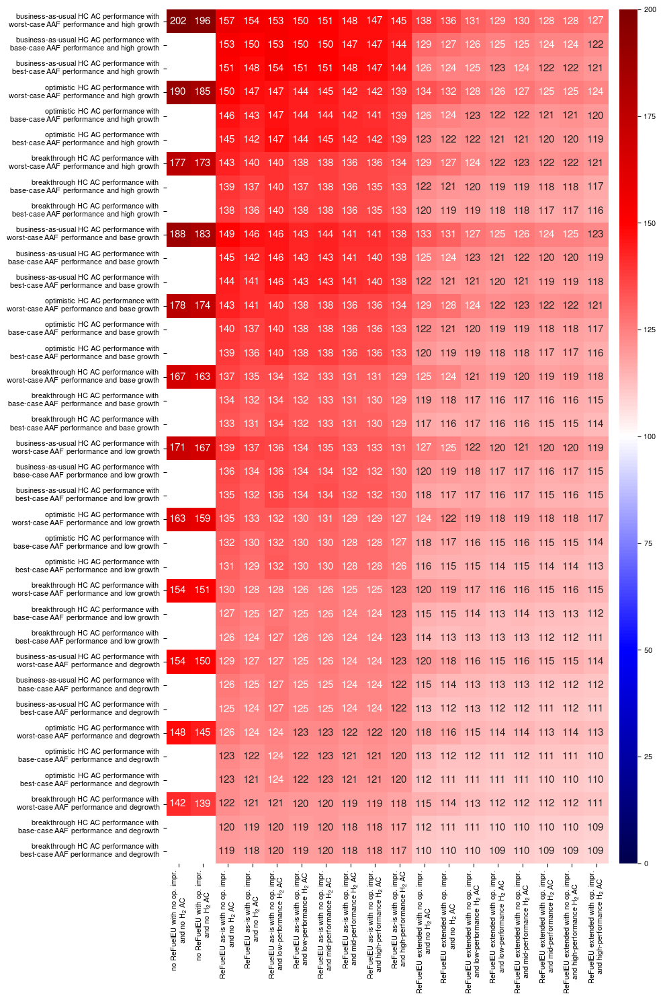

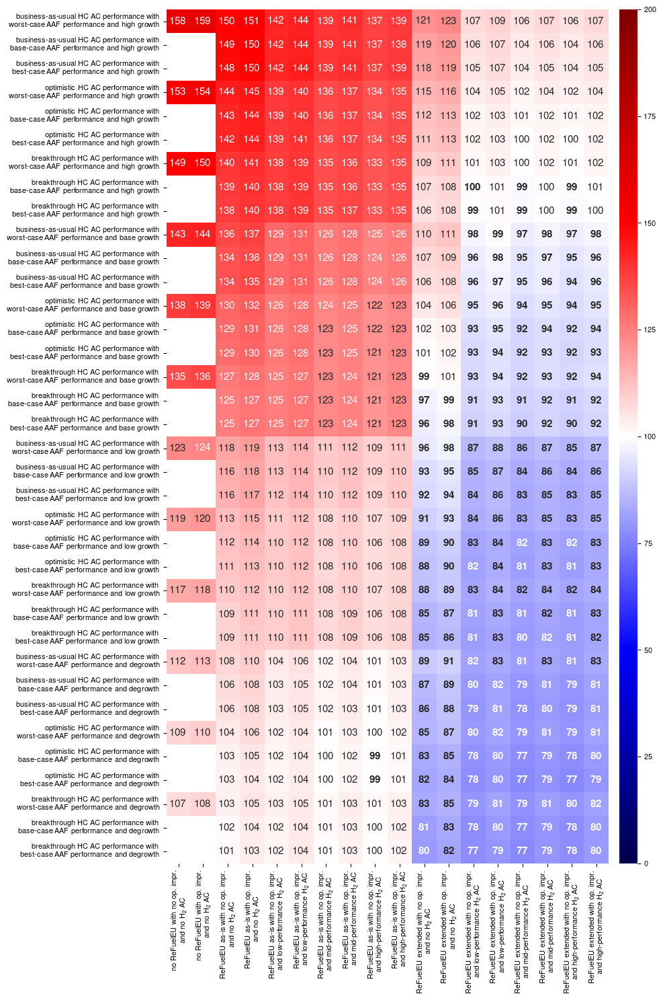

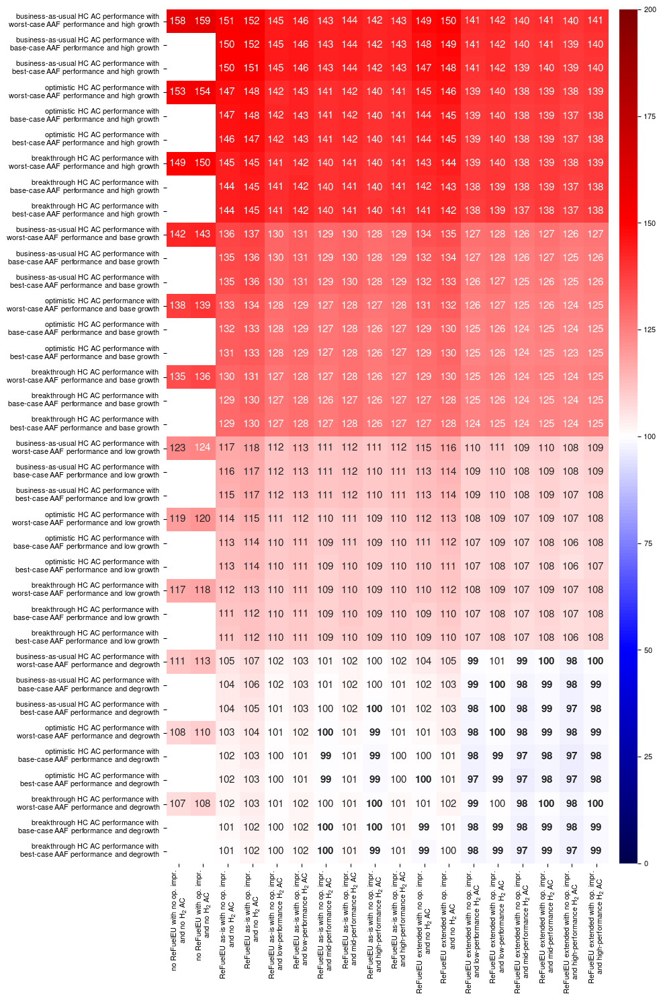

In [22]:
# create four big plots for foreground sensitivity analysis
heat_map_foreground_df_1, heat_map_foreground_df_2, heat_map_foreground_df_3, heat_map_foreground_df_4 = make_foreground_heat_map(year_of_interest, flight_start_year, all_scenario_names, all_scenario_results, target, mode)
plot_foreground_heat_map(heat_map_foreground_df_1, heat_map_foreground_df_2, heat_map_foreground_df_3, heat_map_foreground_df_4, folder_figures, mode)

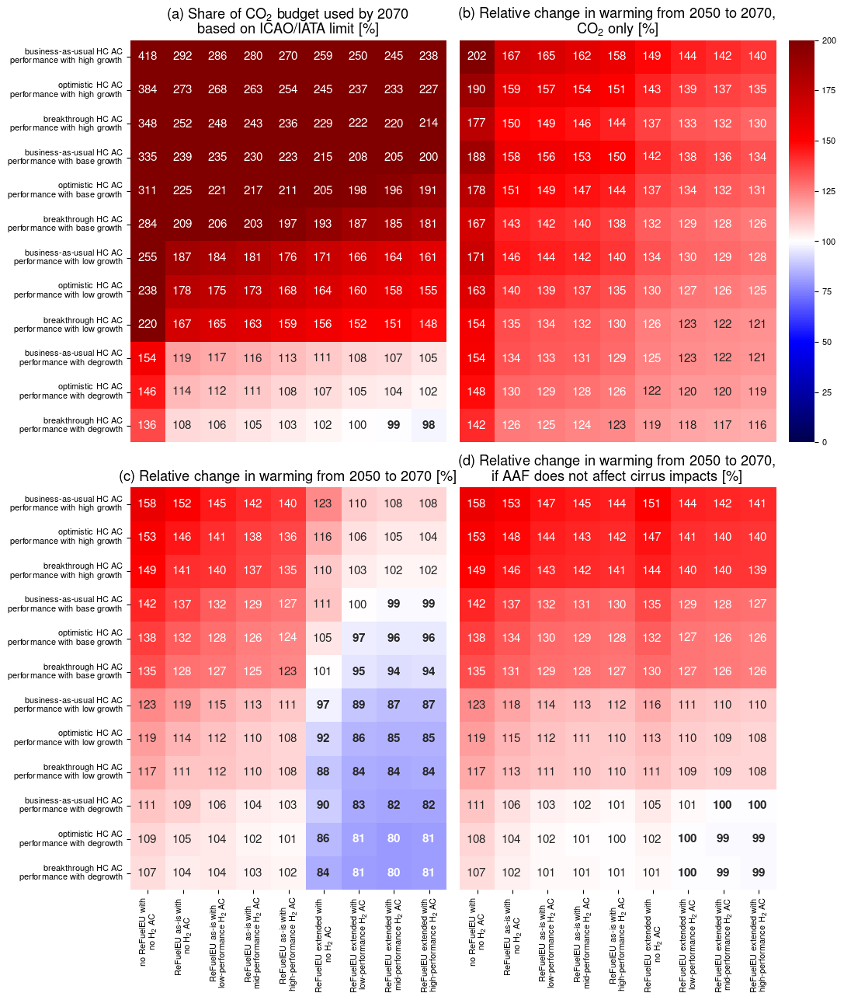

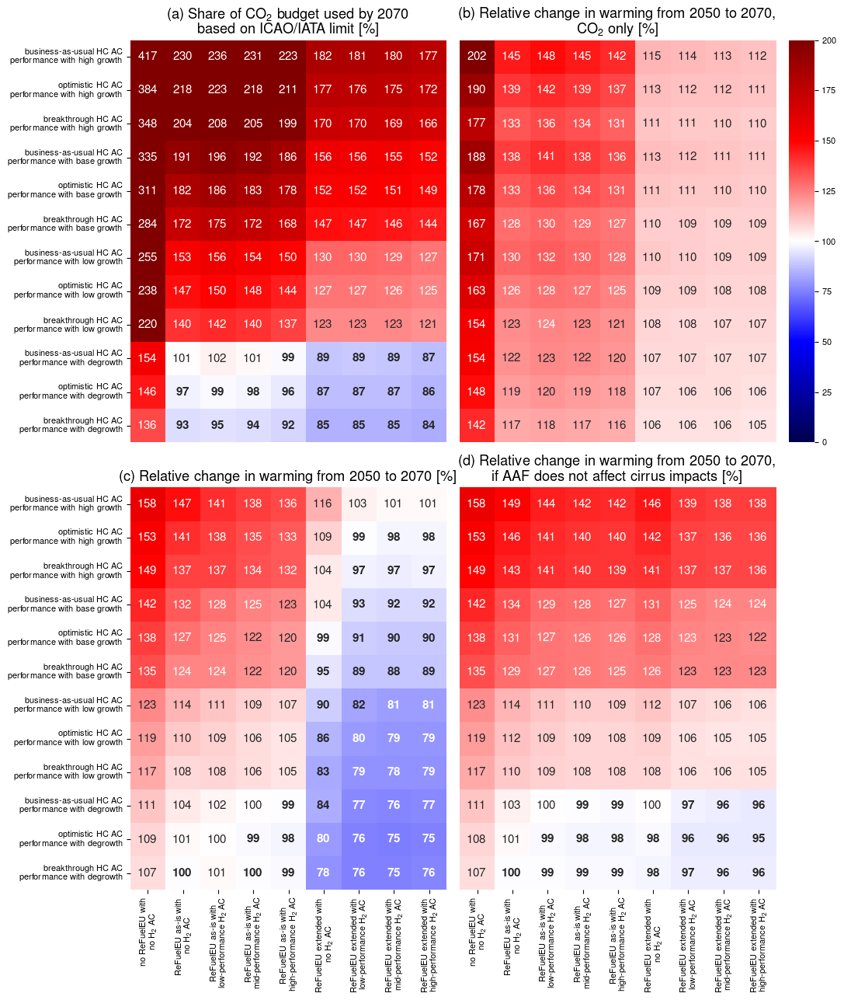

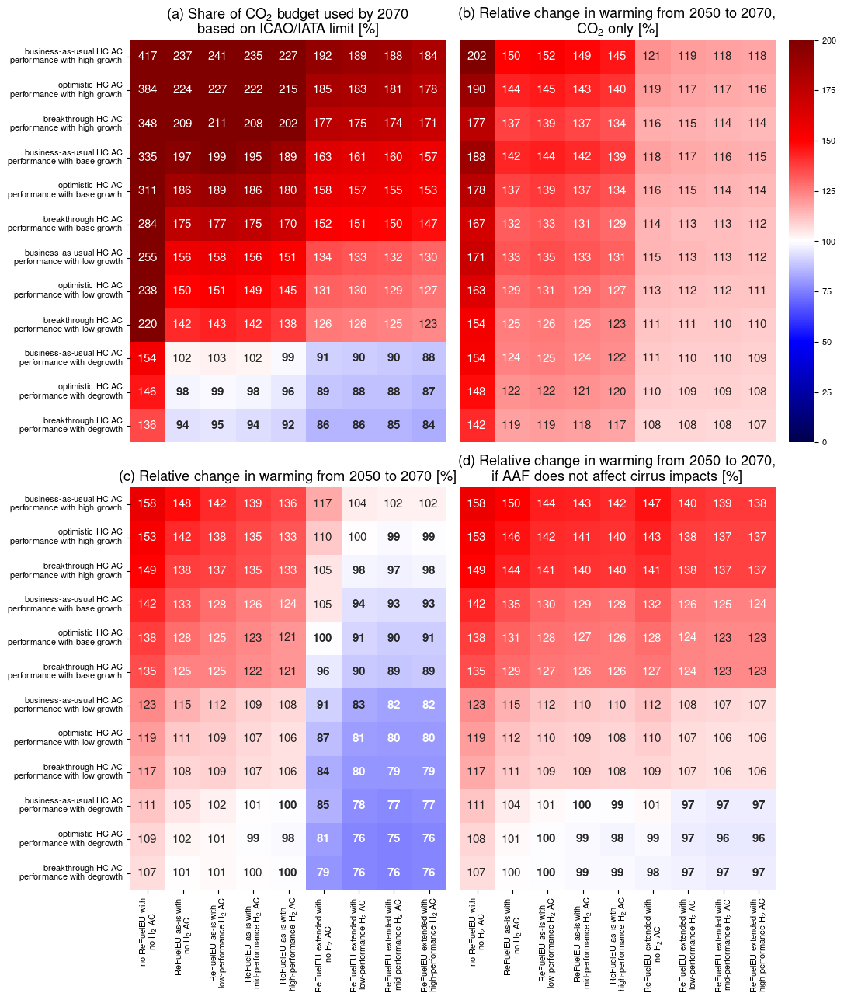

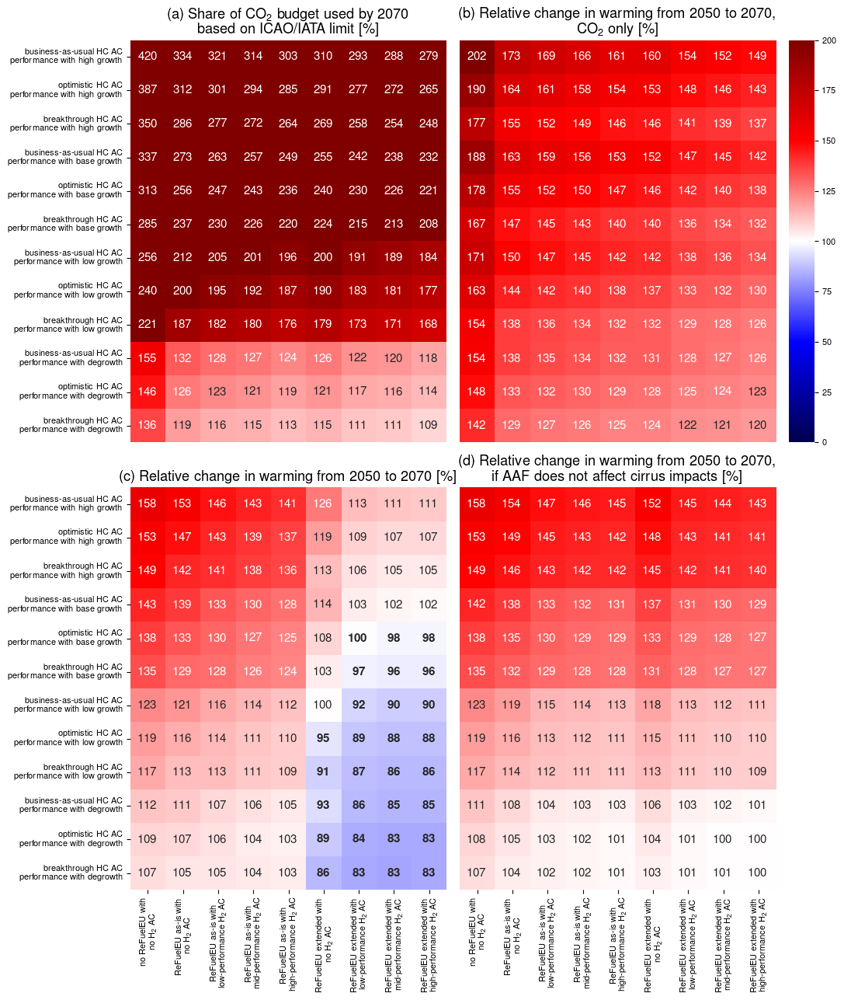

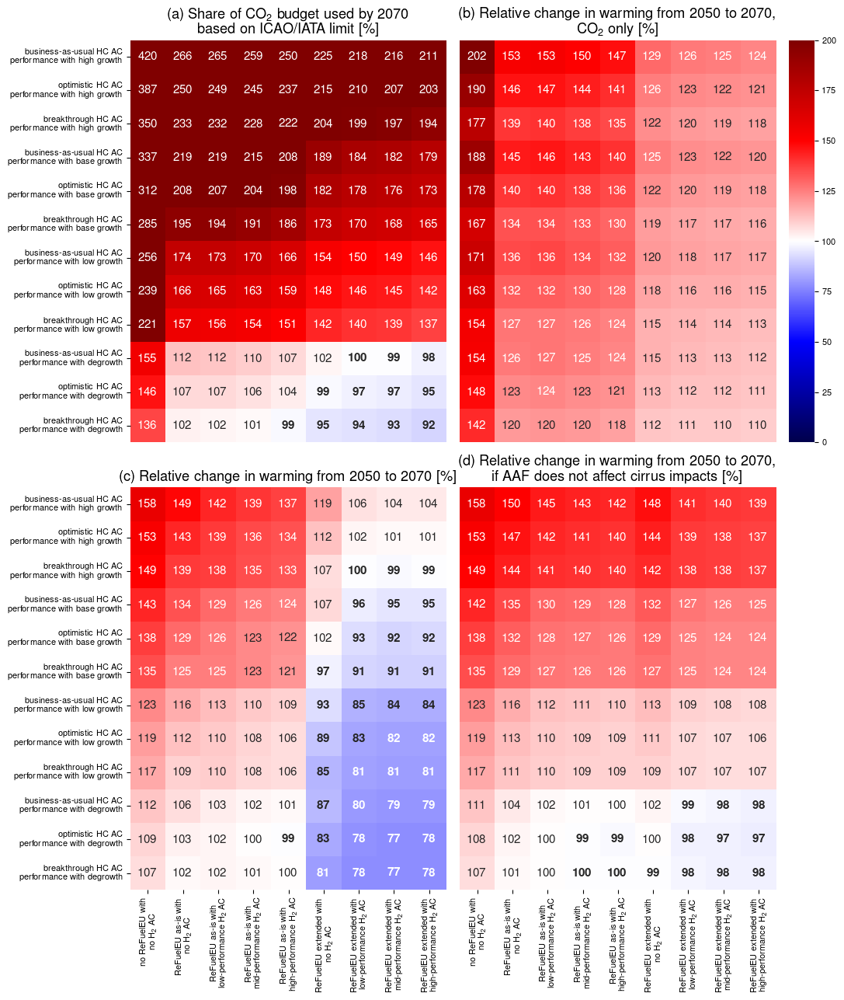

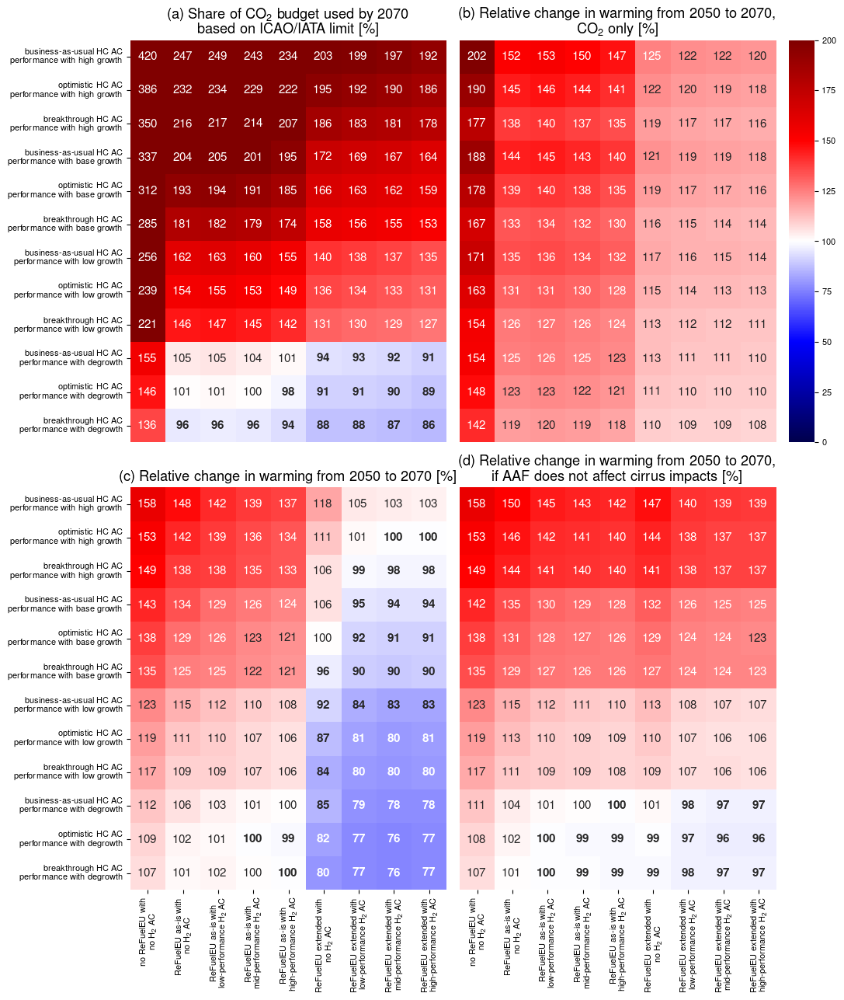

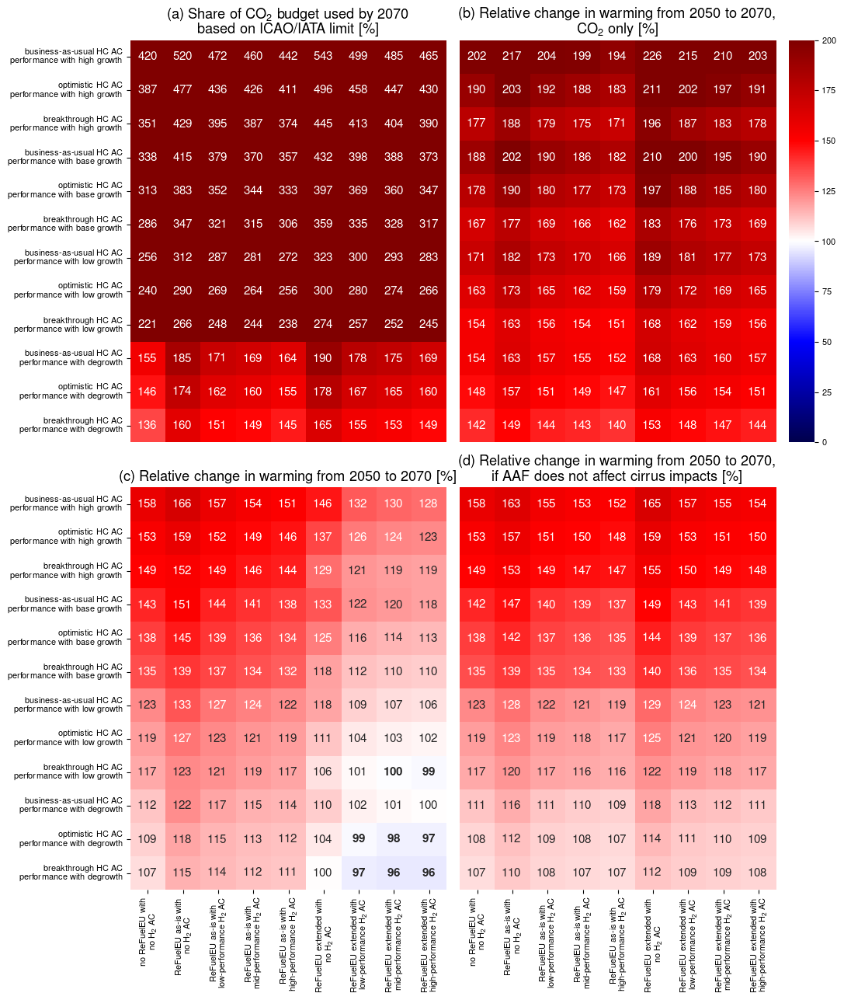

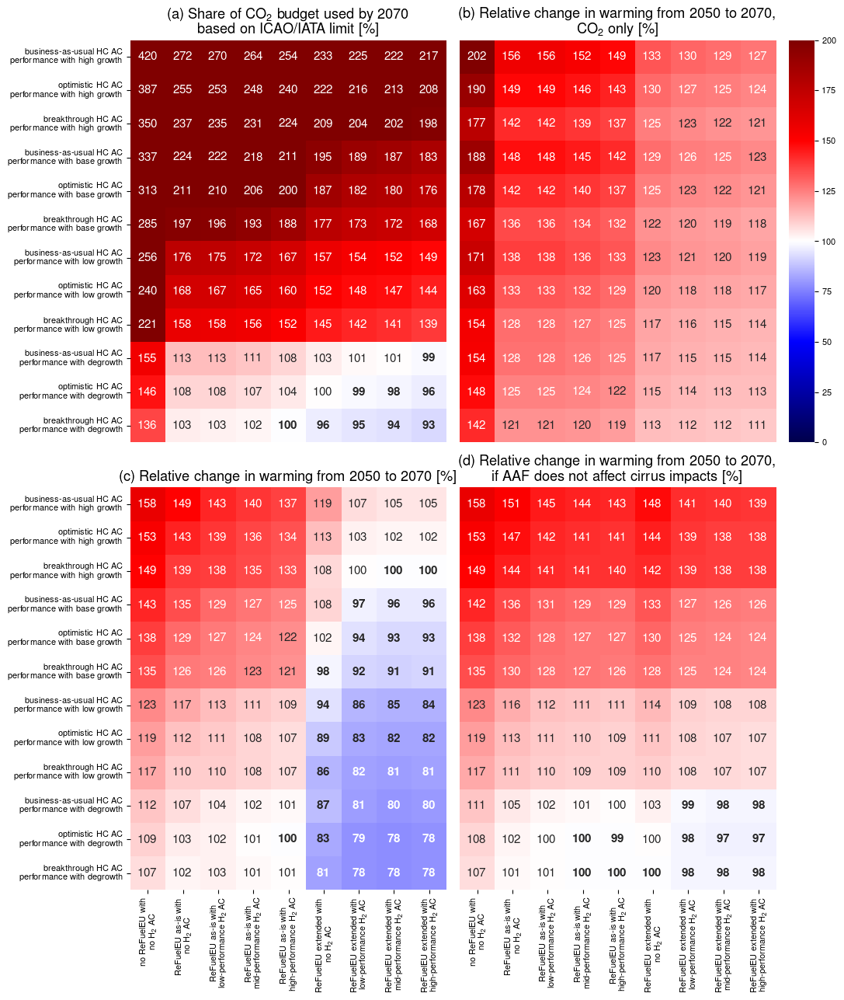

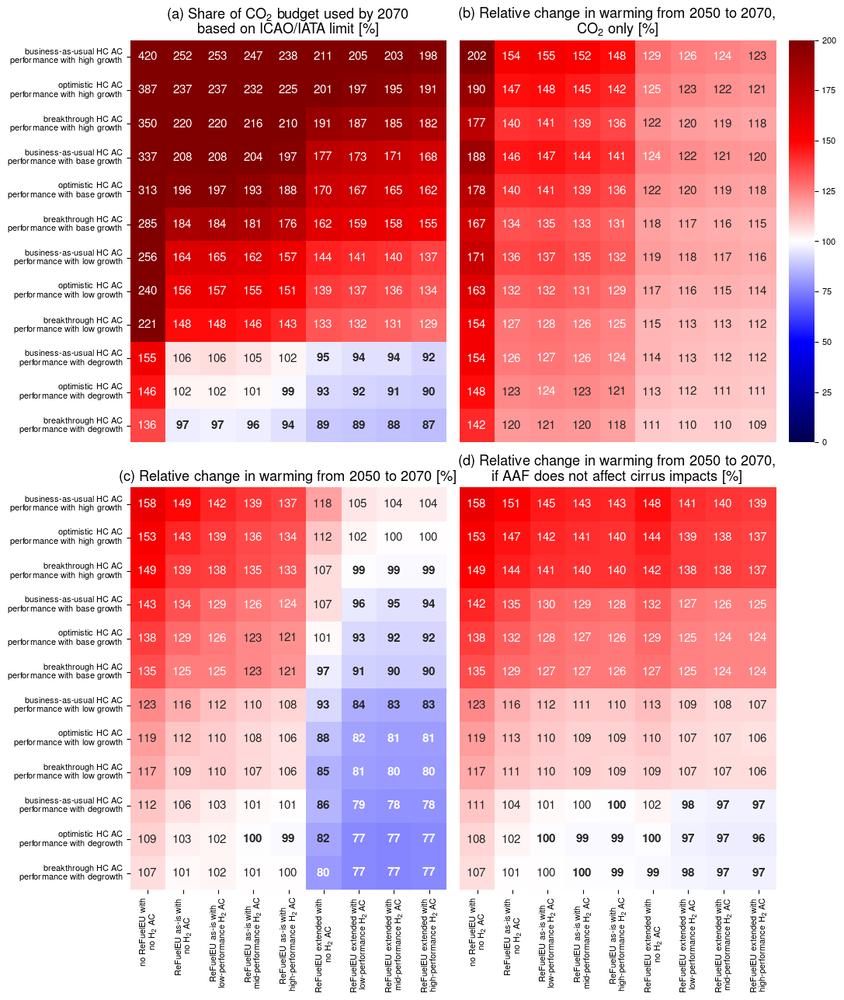

In [23]:
# create nine 2x2 plots for background sensitivity analysis
for background in ['1.4C', '1.7C', '2.5C']:
    for hydrogen_source in ['market', 'grid', 'wind']:
        heat_map_background_df_1, heat_map_background_df_2, heat_map_background_df_3, heat_map_background_df_4 = make_background_heat_map(year_of_interest, flight_start_year, all_scenario_names_bck, all_scenario_results_bck, background, hydrogen_source, target, mode)
        plot_background_heat_map(heat_map_background_df_1, heat_map_background_df_2, heat_map_background_df_3, heat_map_background_df_4, folder_figures, background, hydrogen_source, mode)

Additional heatmaps using LWE as metric.

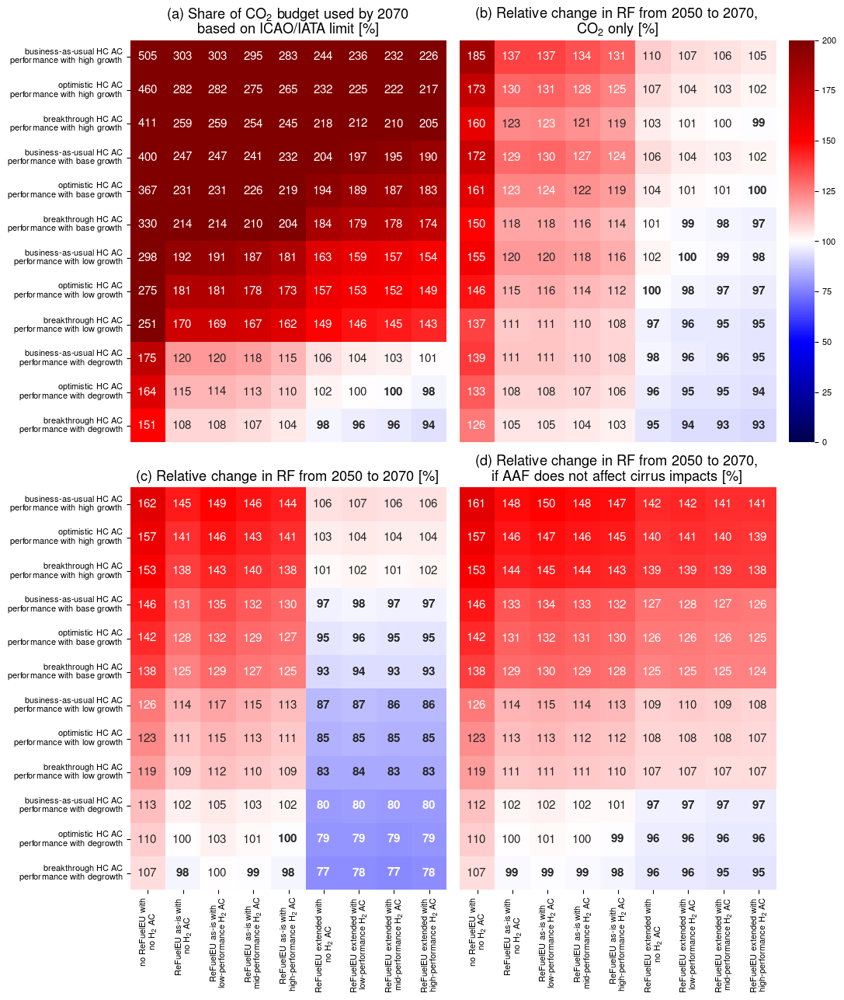

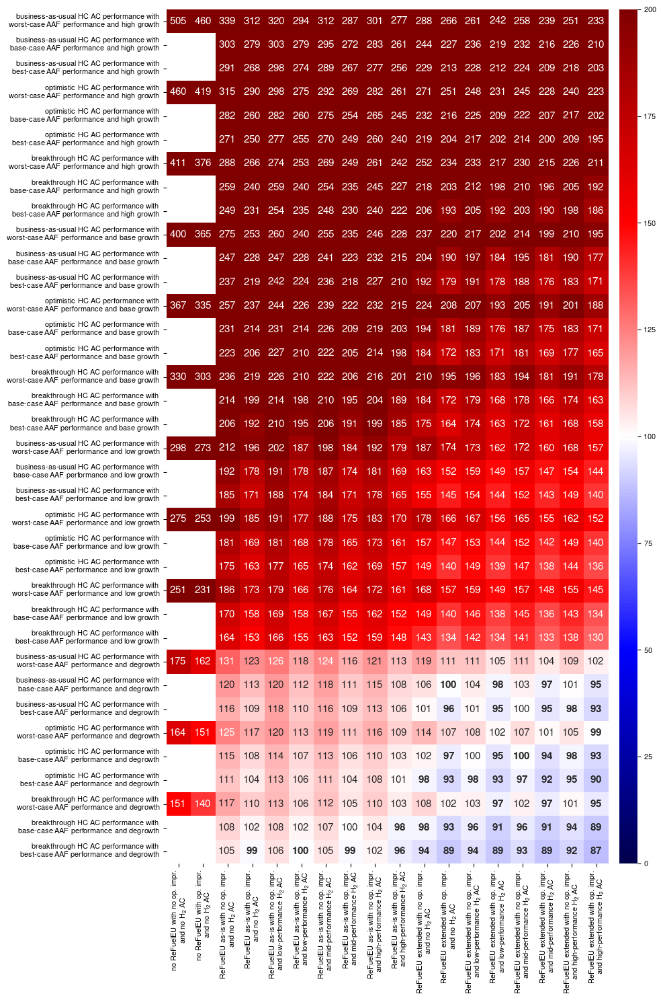

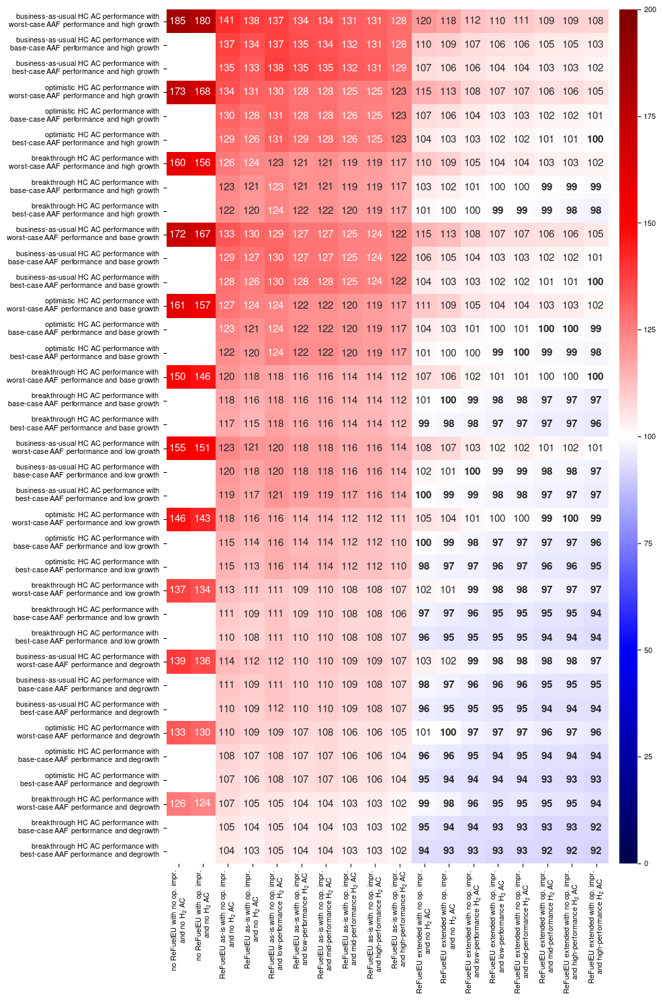

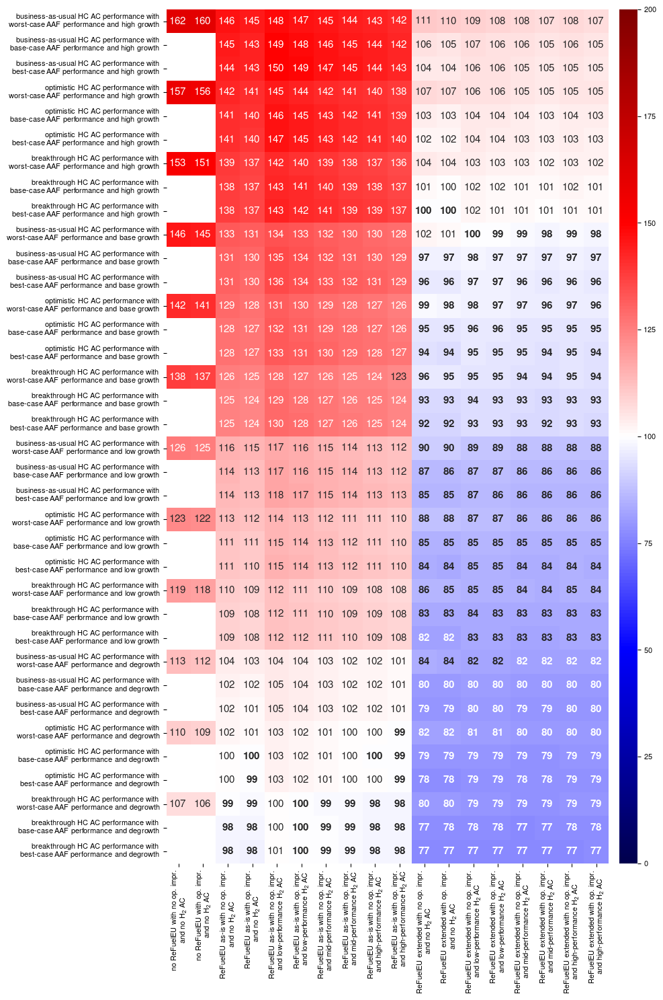

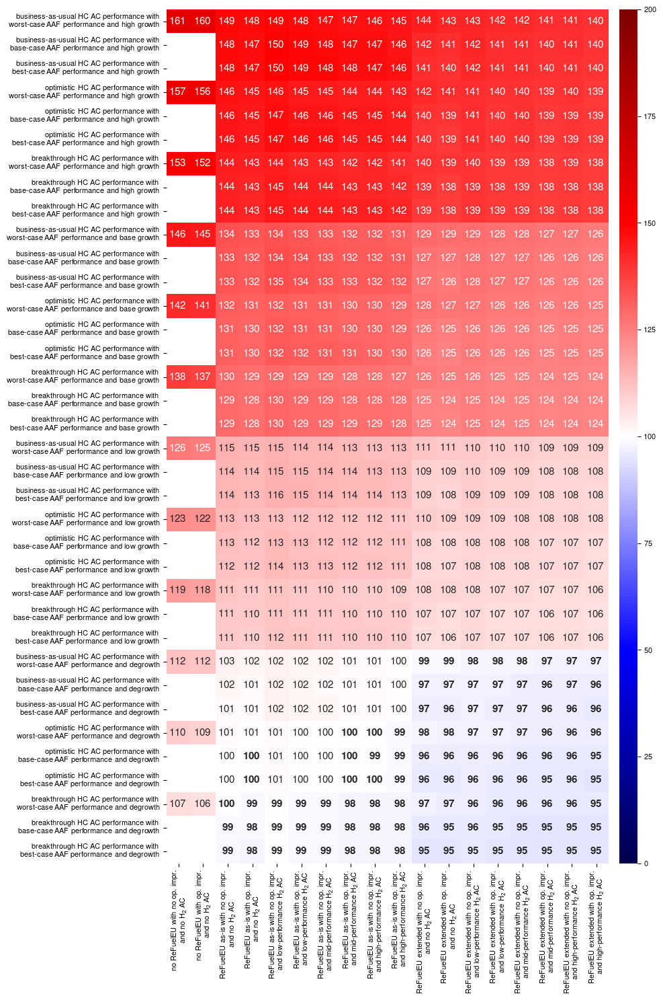

...

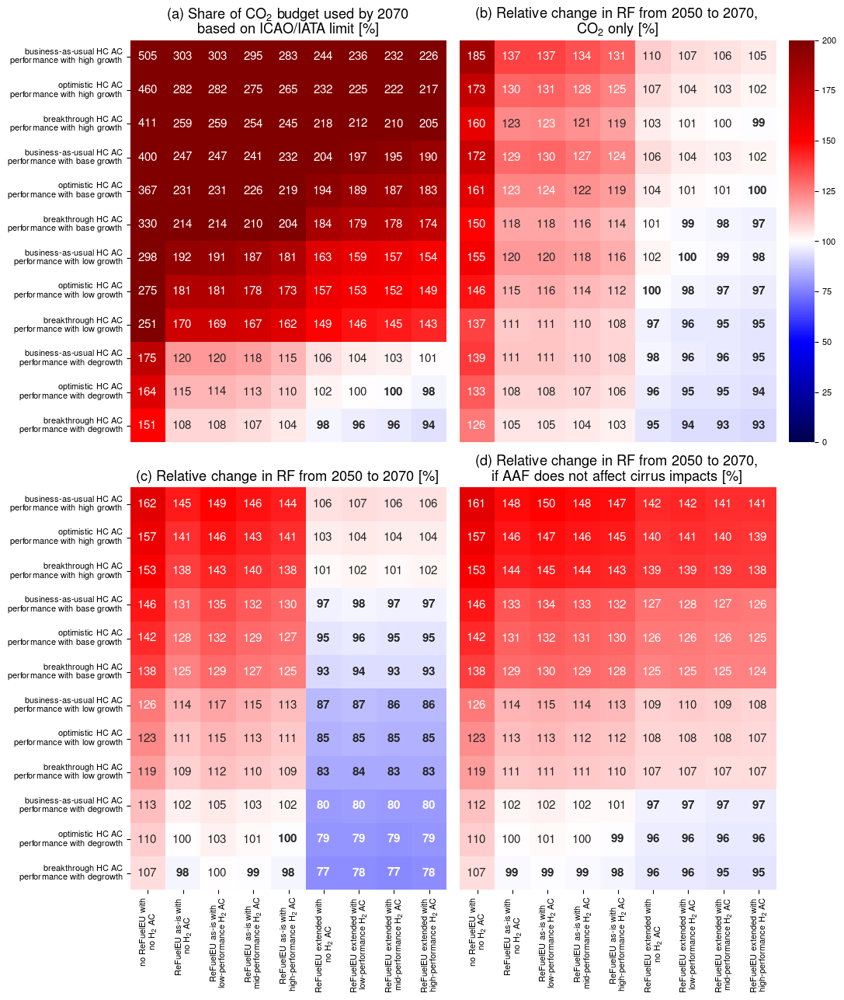

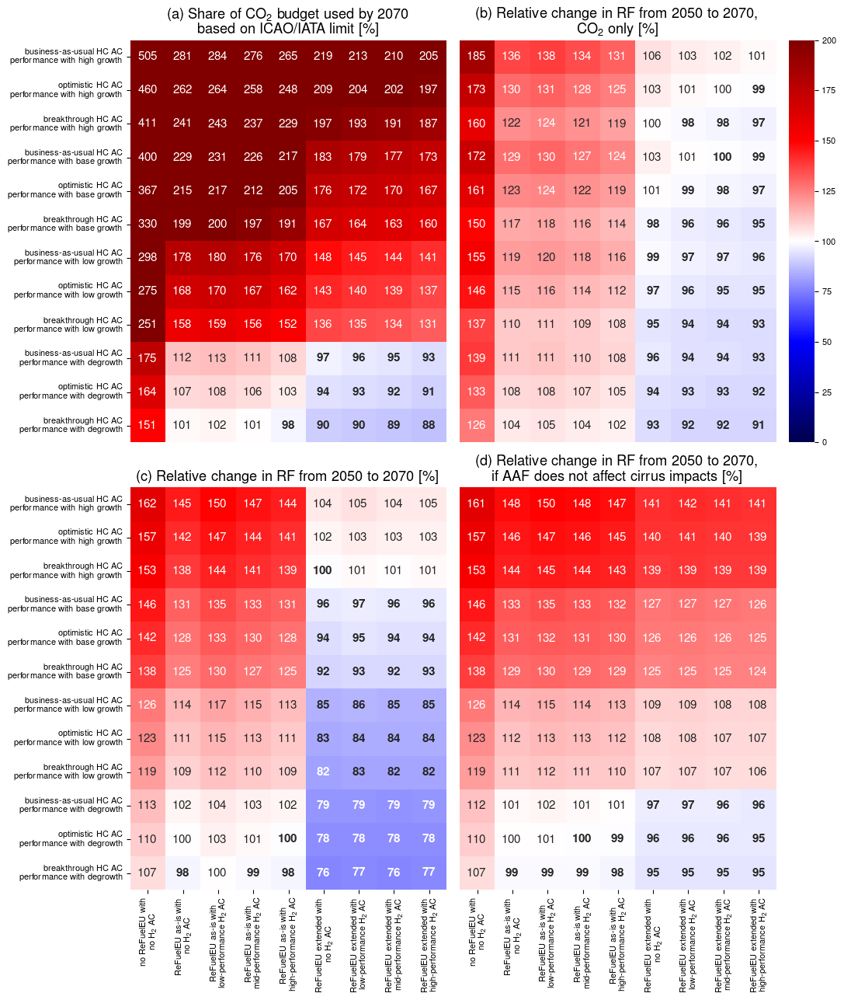

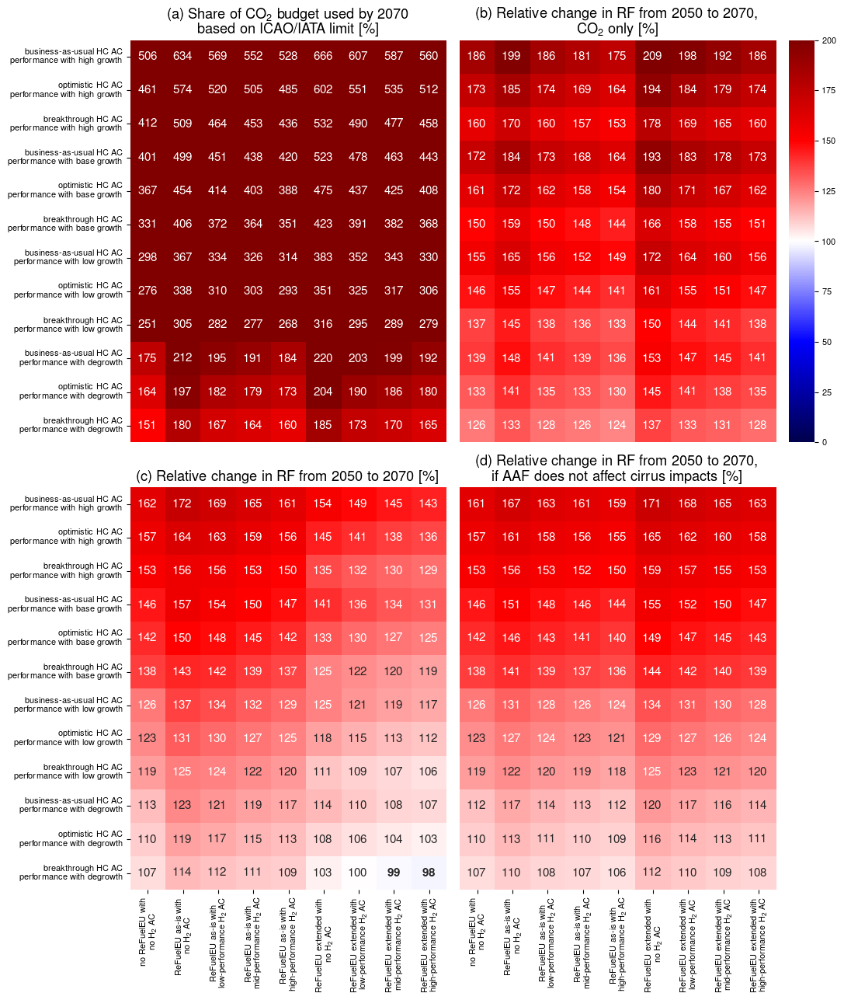

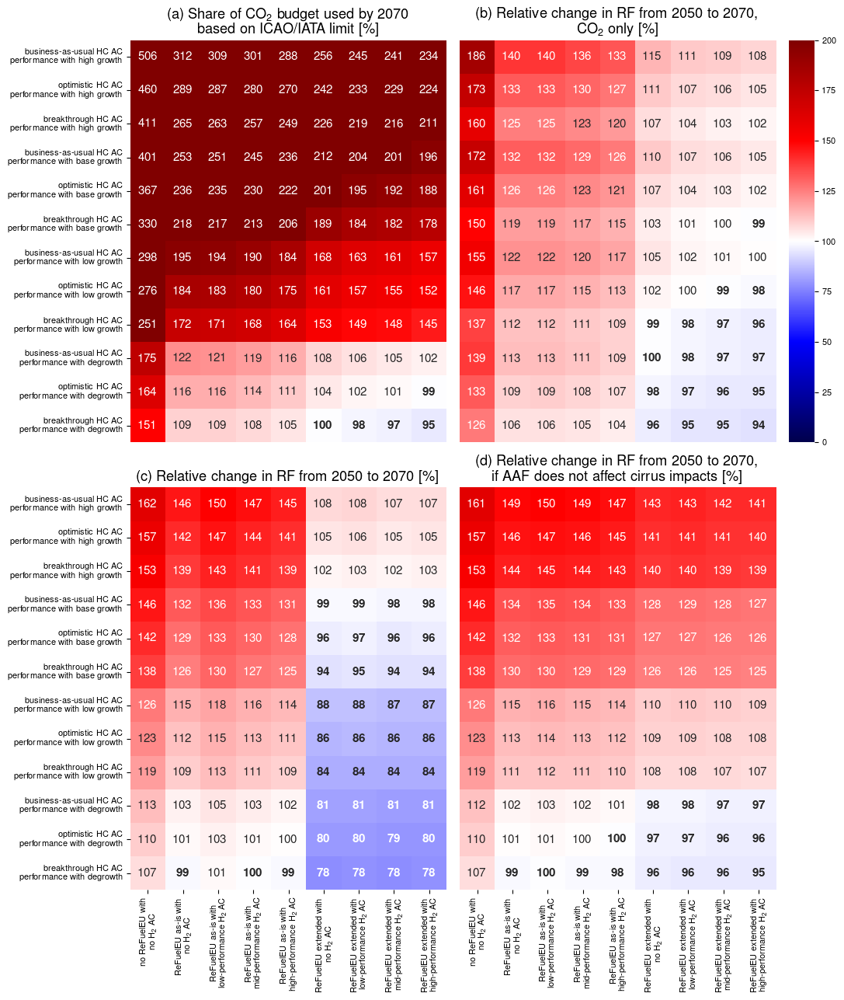

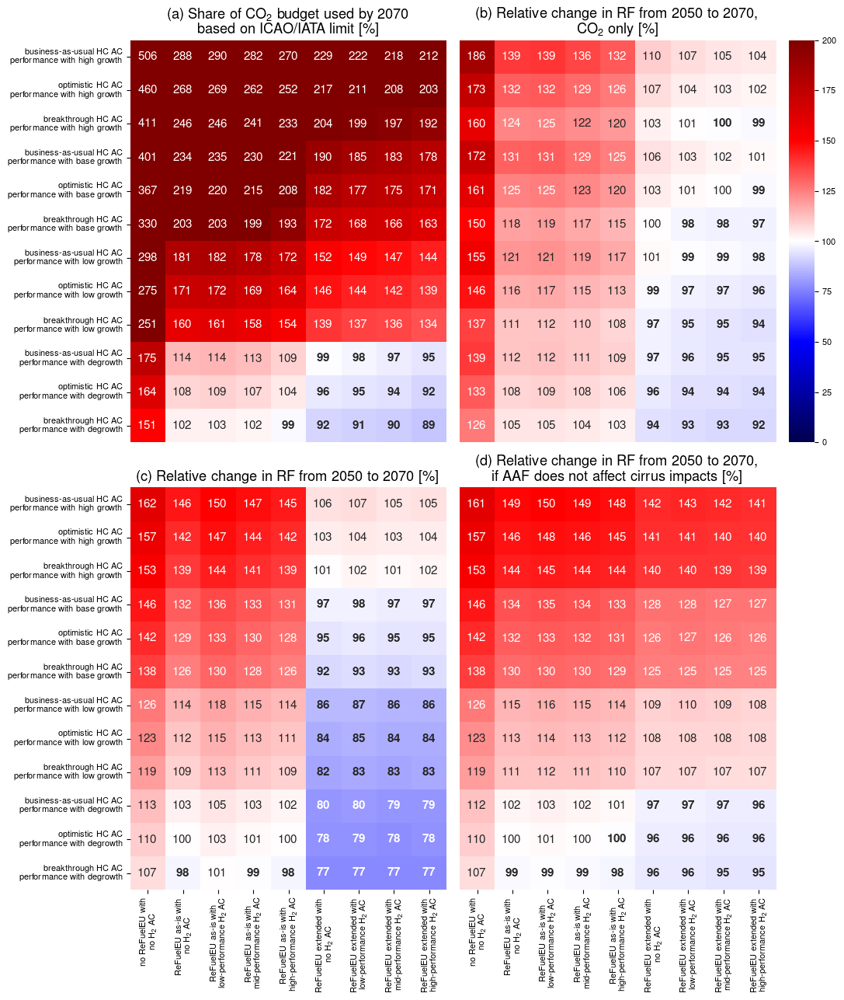

In [24]:
mode = 'LWE'
target = list(RF_CO2_target)

# create heatmaps to check emission targets
heat_map_df_1, heat_map_df_2, heat_map_df_3, heat_map_df_4 = make_target_heat_map(year_of_interest, flight_start_year, all_scenario_names, all_scenario_results, target, mode)
plot_target_heat_map(heat_map_df_1, heat_map_df_2, heat_map_df_3, heat_map_df_4, folder_figures, mode)

# create four big plots for foreground sensitivity analysis
heat_map_foreground_df_1, heat_map_foreground_df_2, heat_map_foreground_df_3, heat_map_foreground_df_4 = make_foreground_heat_map(year_of_interest, flight_start_year, all_scenario_names, all_scenario_results, target, mode)
plot_foreground_heat_map(heat_map_foreground_df_1, heat_map_foreground_df_2, heat_map_foreground_df_3, heat_map_foreground_df_4, folder_figures, mode)

# create nine 2x2 plots for background sensitivity analysis
for background in ['1.4C', '1.7C', '2.5C']:
    for hydrogen_source in ['market', 'grid', 'wind']:
        heat_map_background_df_1, heat_map_background_df_2, heat_map_background_df_3, heat_map_background_df_4 = make_background_heat_map(year_of_interest, flight_start_year, all_scenario_names_bck, all_scenario_results_bck, background, hydrogen_source, target, mode)
        plot_background_heat_map(heat_map_background_df_1, heat_map_background_df_2, heat_map_background_df_3, heat_map_background_df_4, folder_figures, background, hydrogen_source, mode)